# Trabajo Fin de Máster

## Obtención de los Datos

Los datos se obtienen del dataset *SoccerNet*, disponible públicamente en Github.

In [ ]:
# Instalar SoccerNet en el entorno
!pip install SoccerNet
import SoccerNet
from SoccerNet.Downloader import SoccerNetDownloader
from SoccerNet.utils import getListGames

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.9/86.9 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.9/139.9 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.7/67.7 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 56.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.7/13.7 MB 65.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.2/85.2 kB 5.1 MB/s eta 0:00:00


In [ ]:
# Obtención de datos (la primera vez) y almacenamiento en Google Drive
from google.colab import drive

# Almacenar datos en Google Drive
drive.mount('/content/drive')

# Carpeta persistente en Drive
path = "/content/drive/MyDrive/SoccerNet"

# Carpeta local en Colab donde se guardarán los datos
downloader = SoccerNetDownloader(LocalDirectory=path)

# Descarga de videos 224p y etiquetas v2
downloader.password = # Solicitar al equipo de SoccerNet
downloader.downloadGames(
    files=["Labels-v2.json", "1_720p.mkv", "2_720p.mkv"],
    split=["train", "valid", "test"]
)

# Lista de partidos disponibles para entrenamiento
train_games = getListGames(split="train")
print(f"Ejemplos de partidos de entrenamiento:\n{train_games[:5]}")


Mounted at /content/drive
/content/drive/MyDrive/SoccerNet/england_epl/2014-2015/2015-02-21 - 18-00 Chelsea 1 - 1 Burnley/Labels-v2.json already exists
/content/drive/MyDrive/SoccerNet/england_epl/2014-2015/2015-02-21 - 18-00 Chelsea 1 - 1 Burnley/1_720p.mkv already exists
/content/drive/MyDrive/SoccerNet/england_epl/2014-2015/2015-02-21 - 18-00 Chelsea 1 - 1 Burnley/2_720p.mkv already exists
/content/drive/MyDrive/SoccerNet/england_epl/2014-2015/2015-02-21 - 18-00 Crystal Palace 1 - 2 Arsenal/Labels-v2.json already exists
/content/drive/MyDrive/SoccerNet/england_epl/2014-2015/2015-02-21 - 18-00 Crystal Palace 1 - 2 Arsenal/1_720p.mkv already exists
/content/drive/MyDrive/SoccerNet/england_epl/2014-2015/2015-02-21 - 18-00 Crystal Palace 1 - 2 Arsenal/2_720p.mkv already exists
/content/drive/MyDrive/SoccerNet/england_epl/2014-2015/2015-02-21 - 18-00 Swansea 2 - 1 Manchester United/Labels-v2.json already exists
/content/drive/MyDrive/SoccerNet/england_epl/2014-2015/2015-02-21 - 18-00 Swa

In [ ]:
# Obtención de datos desde Google Drive
from google.colab import drive
drive.mount('/content/drive')
path = "/content/drive/MyDrive/SoccerNet"

Mounted at /content/drive


In [ ]:
# Comprobar acceso correcto a los datos
import os

# Lista de ligas disponibles
print("Ligas disponibles:", os.listdir(path))

# Explorar una liga (por ejemplo, 'england_epl')
league_path = os.path.join(path, "england_epl")
print("Temporadas:", os.listdir(league_path))

# Explorar una temporada (por ejemplo, '2014-2015')
season_path = os.path.join(league_path, "2014-2015")
print("Partidos disponibles:", os.listdir(season_path))

# Explorar un partido concreto
game = os.listdir(season_path)[1]
game_path = os.path.join(season_path, game)
print("Archivos del partido:", os.listdir(game_path))

Ligas disponibles: ['england_epl', 'europe_uefa-champions-league', 'france_ligue-1', 'germany_bundesliga', 'italy_serie-a', 'spain_laliga', 'eventos_filtrados_milisegundos.csv']
Temporadas: ['2014-2015', '2015-2016', '2016-2017']
Partidos disponibles: ['2015-02-21 - 18-00 Chelsea 1 - 1 Burnley', '2015-02-21 - 18-00 Crystal Palace 1 - 2 Arsenal', '2015-02-21 - 18-00 Swansea 2 - 1 Manchester United', '2015-02-22 - 19-15 Southampton 0 - 2 Liverpool', '2015-04-11 - 19-30 Burnley 0 - 1 Arsenal', '2015-05-17 - 18-00 Manchester United 1 - 1 Arsenal']
Archivos del partido: ['Labels-v2.json', '1_720p.mkv', '2_720p.mkv']


## Exploratory Data Analysis (EDA)

### Vídeos de partidos

In [ ]:
# Obtener número total de vídeos
import os

# Ruta base donde están los vídeos descargados
base_path = "/content/drive/MyDrive/SoccerNet"

# Contador de archivos de vídeo (.mkv)
video_files = []

# Recorrer recursivamente todos los subdirectorios
for root, dirs, files in os.walk(base_path):
    for file in files:
        if file.endswith(".mkv"):
            video_files.append(os.path.join(root, file))

# Resultado
print(f"Número total de vídeos encontrados: {len(video_files)}")
print("Ejemplos de rutas:")
for path in video_files[:5]:
    print(" -", path)

Número total de vídeos encontrados: 1000
Ejemplos de rutas:
 - /content/drive/MyDrive/SoccerNet/england_epl/2014-2015/2015-02-21 - 18-00 Chelsea 1 - 1 Burnley/1_720p.mkv
 - /content/drive/MyDrive/SoccerNet/england_epl/2014-2015/2015-02-21 - 18-00 Chelsea 1 - 1 Burnley/2_720p.mkv
 - /content/drive/MyDrive/SoccerNet/england_epl/2014-2015/2015-02-21 - 18-00 Crystal Palace 1 - 2 Arsenal/1_720p.mkv
 - /content/drive/MyDrive/SoccerNet/england_epl/2014-2015/2015-02-21 - 18-00 Crystal Palace 1 - 2 Arsenal/2_720p.mkv
 - /content/drive/MyDrive/SoccerNet/england_epl/2014-2015/2015-02-21 - 18-00 Swansea 2 - 1 Manchester United/1_720p.mkv


In [ ]:
# Explorar las características de un vídeo
import cv2
import os

# Ruta del vídeo (primer tiempo de un partido de ejemplo)
video_path = os.path.join(game_path, "1_720p.mkv")

# Abrir vídeo
cap = cv2.VideoCapture(video_path)

# Comprobar si se abre correctamente
if not cap.isOpened():
    print("No se pudo abrir el vídeo.")
else:
    # Extraer propiedades
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = frame_count / fps
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    print("Propiedades del vídeo:")
    print(f"Resolución: {width} x {height}")
    print(f"FPS: {fps}")
    print(f"Frames totales: {frame_count}")
    print(f"Duración estimada: {duration:.2f} segundos")


Propiedades del vídeo:
Resolución: 1280 x 720
FPS: 25.0
Frames totales: 69175
Duración estimada: 2767.00 segundos


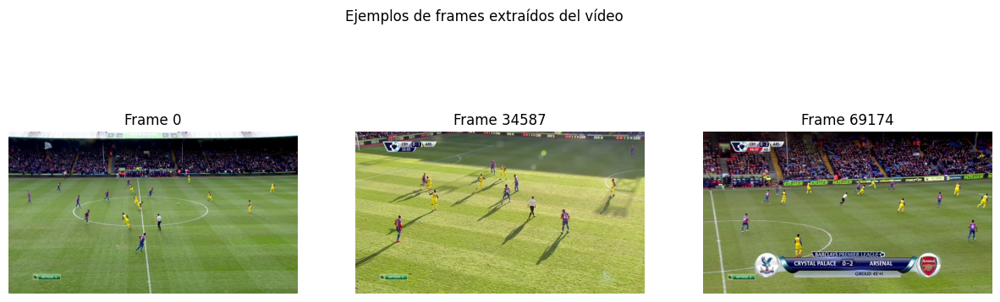

In [ ]:
# Extraer y mostrar frames representativos
import cv2
import matplotlib.pyplot as plt

# Volver a abrir el vídeo
cap = cv2.VideoCapture(video_path)

# Obtener nuevo frame count si es necesario
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
sample_frames = [0, frame_count // 2, frame_count - 1]

frames = []

for frame_num in sample_frames:
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
    ret, frame = cap.read()
    if ret:
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame_rgb)
    else:
        print(f"No se pudo leer el frame {frame_num}")
        frames.append(None)

cap.release()

# Mostrar los frames extraídos
plt.figure(figsize=(15, 5))
for i, frame in enumerate(frames):
    plt.subplot(1, 3, i + 1)
    if frame is not None:
        plt.imshow(frame)
        plt.title(f"Frame {sample_frames[i]}")
        plt.axis("off")
    else:
        plt.text(0.5, 0.5, "Error", ha="center", va="center")
plt.suptitle("Ejemplos de frames extraídos del vídeo")
plt.show()

In [ ]:
# Ejemplo: muestreo a 2 fps
target_fps = 2
frame_interval = int(fps / target_fps)
print(f"Para muestreo a {target_fps} fps, extraer un frame cada {frame_interval} frames.")

Para muestreo a 2 fps, extraer un frame cada 12 frames.


In [ ]:
# Análisis conjunto de los vídeos
import cv2
import os
import numpy as np
from SoccerNet.utils import getListGames
from tqdm import tqdm

# Ruta base
base_path = "/content/drive/MyDrive/SoccerNet"
all_games = getListGames(split=["train", "valid", "test"])

# Inicializar listas
resolutions = []
fps_list = []
frame_counts = []
durations = []

# Recorrer todos los vídeos
for game in tqdm(all_games, desc="Analizando vídeos"):
    for half in ["1_720p.mkv", "2_720p.mkv"]:
        video_path = os.path.join(base_path, game, half)
        if os.path.exists(video_path):
            cap = cv2.VideoCapture(video_path)
            if cap.isOpened():
                width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
                height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
                fps = cap.get(cv2.CAP_PROP_FPS)
                frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
                duration = frames / fps if fps > 0 else 0

                resolutions.append((width, height))
                fps_list.append(fps)
                frame_counts.append(frames)
                durations.append(duration)
            cap.release()

Analizando vídeos: 100%|██████████| 500/500 [07:37<00:00,  1.09it/s]


In [ ]:
# Mostrar estadísticas
import pandas as pd

# Crear DataFrame para estadísticas
df_videos = pd.DataFrame({
    "resolution": resolutions,
    "fps": fps_list,
    "frames": frame_counts,
    "duration_sec": durations
})

# Estadísticas generales
print("Estadísticas generales de los vídeos:\n")
print(df_videos.describe())

# Resoluciones únicas
print("\nResoluciones únicas detectadas:")
print(df_videos["resolution"].value_counts())

# FPS únicos
print("\nFPS únicos detectados:")
print(df_videos["fps"].value_counts())


Estadísticas generales de los vídeos:

          fps        frames  duration_sec
count  1000.0   1000.000000   1000.000000
mean     25.0  68767.400000   2750.696000
std       0.0   2267.887355     90.715494
min      25.0  60225.000000   2409.000000
25%      25.0  67500.000000   2700.000000
50%      25.0  67500.000000   2700.000000
75%      25.0  69350.000000   2774.000000
max      25.0  81175.000000   3247.000000

Resoluciones únicas detectadas:
resolution
(1280, 720)    1000
Name: count, dtype: int64

FPS únicos detectados:
fps
25.0    1000
Name: count, dtype: int64


### Etiquetas de un partido

In [ ]:
# Análisis de las etiquetas de un partido de ejemplo
import json
from pprint import pprint

# Ubicación en Google Drive del partido
base_path = "/content/drive/MyDrive/SoccerNet"
example_game = os.path.join(base_path, "england_epl/2014-2015/2015-02-21 - 18-00 Chelsea 1 - 1 Burnley")

# Cargar el archivo de etiquetas
with open(os.path.join(example_game, "Labels-v2.json"), "r") as f:
    labels = json.load(f)

# Acceder a la lista de anotaciones y ver los primeros 3 eventos
annotations = labels["annotations"]
pprint(annotations[:3])

[{'gameTime': '1 - 00:00',
  'label': 'Kick-off',
  'position': '0',
  'team': 'away',
  'visibility': 'visible'},
 {'gameTime': '1 - 02:13',
  'label': 'Ball out of play',
  'position': '133295',
  'team': 'not applicable',
  'visibility': 'visible'},
 {'gameTime': '1 - 02:29',
  'label': 'Throw-in',
  'position': '149168',
  'team': 'away',
  'visibility': 'visible'}]


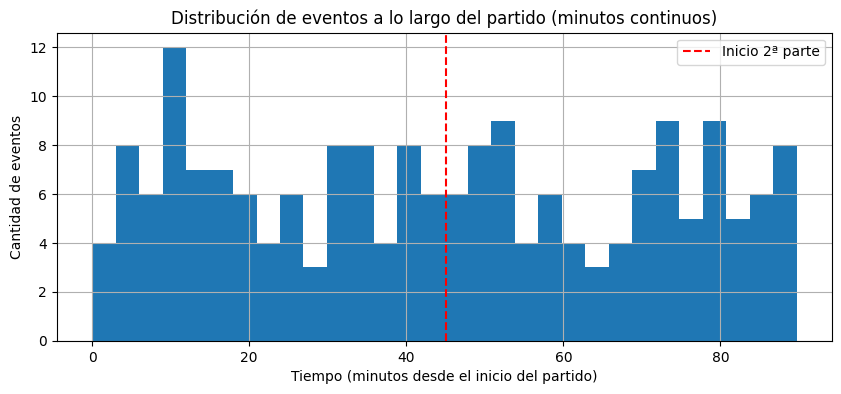

In [ ]:
# Distribución temporal de los eventos
import matplotlib.pyplot as plt

# Convertir posición (en ms) a minutos relativos por mitad
times_adjusted_min = []
for event in annotations:
    ms = int(event["position"])
    min_rel = ms / 60000  # tiempo relativo a la mitad
    if event["gameTime"].startswith("2"):
        min_abs = 45 + min_rel  # segundo tiempo empieza en el minuto 45
    else:
        min_abs = min_rel  # primer tiempo empieza en 0
    times_adjusted_min.append(min_abs)

# Graficar en agrupaciones de eventos cada 3 minutos
plt.figure(figsize=(10, 4))
plt.hist(times_adjusted_min, bins=30)
plt.title("Distribución de eventos a lo largo del partido (minutos continuos)")
plt.xlabel("Tiempo (minutos desde el inicio del partido)")
plt.ylabel("Cantidad de eventos")
plt.grid(True)
plt.axvline(45, color='red', linestyle='--', label='Inicio 2ª parte')
plt.legend()
plt.show()

In [ ]:
# Eventos de cada mitad del partido
first_half = [e for e in annotations if e["gameTime"].startswith("1")]
second_half = [e for e in annotations if e["gameTime"].startswith("2")]

print(f"Eventos en el primer tiempo: {len(first_half)}")
print(f"Eventos en el segundo tiempo: {len(second_half)}")

Eventos en el primer tiempo: 97
Eventos en el segundo tiempo: 93


In [ ]:
# Distribución por tipo de evento
from collections import Counter
import matplotlib.pyplot as plt

# Extraer el tipo de evento de cada anotación
event_labels = [event["label"] for event in annotations]

# Contar frecuencia de cada tipo
event_counts = Counter(event_labels)

# Mostrar en consola
print("Frecuencia por tipo de evento:")
for label, count in event_counts.items():
    print(f"{label}: {count}")

Frecuencia por tipo de evento:
Kick-off: 4
Ball out of play: 68
Throw-in: 38
Corner: 14
Shots on target: 8
Offside: 3
Shots off target: 7
Clearance: 20
Goal: 2
Foul: 16
Yellow card: 3
Indirect free-kick: 1
Direct free-kick: 1
Substitution: 4
Red card: 1


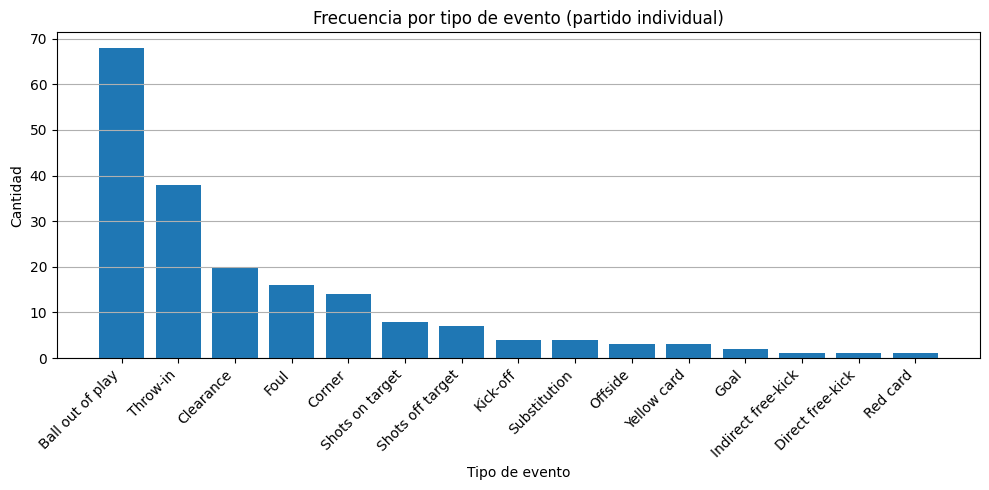

In [ ]:
# Mostrar gráfico
labels_sorted = sorted(event_counts.items(), key=lambda x: x[1], reverse=True)
labels, counts = zip(*labels_sorted)

# Graficar
plt.figure(figsize=(10, 5))
plt.bar(labels, counts)
plt.xticks(rotation=45, ha="right")
plt.title("Frecuencia por tipo de evento (partido individual)")
plt.xlabel("Tipo de evento")
plt.ylabel("Cantidad")
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [ ]:
# Ejemplos de eventos clave (goles y tiros)
goals = [e for e in annotations if e["label"] == "Goal"]
shots_on = [e for e in annotations if e["label"] == "Shots on target"]
shots_off = [e for e in annotations if e["label"] == "Shots off target"]

print(f"Goles detectados: {len(goals)}")
if goals:
    print("Ejemplo de gol:")
    pprint(goals[0])

print(f"\nTiros a puerta: {len(shots_on)}")
print(f"Tiros fuera: {len(shots_off)}")

Goles detectados: 2
Ejemplo de gol:
{'gameTime': '1 - 13:10',
 'label': 'Goal',
 'position': '790722',
 'team': 'home',
 'visibility': 'visible'}

Tiros a puerta: 8
Tiros fuera: 7


### Etiquetas totales disponibles

In [ ]:
import os
import json
from tqdm import tqdm
from collections import Counter
import matplotlib.pyplot as plt
from SoccerNet.utils import getListGames

# Ruta donde tienes todos los datos en tu Drive
base_path = "/content/drive/MyDrive/SoccerNet"

# Obtener listas de partidos por separado
train_games = getListGames(split="train")
print(f"Partidos de entrenamiento: {len(train_games)}")
valid_games = getListGames(split="valid")
print(f"Partidos de validación: {len(valid_games)}")
test_games = getListGames(split="test")
print(f"Partidos de test: {len(test_games)}")

# Obtener lista de todos los partidos
all_games = getListGames(split=["train", "valid", "test"])
print(f"Total de partidos disponibles: {len(all_games)}")

# Unificamos todas las anotaciones
all_annotations = []

for game in tqdm(all_games, desc="Procesando partidos"):
    labels_path = os.path.join(base_path, game, "Labels-v2.json")
    if os.path.exists(labels_path):
        with open(labels_path, "r") as f:
            data = json.load(f)
            annotations = data.get("annotations", [])
            all_annotations.extend(annotations)
    else:
        print(f"No se encontró: {labels_path}")

print(f"\nTotal de eventos recolectados: {len(all_annotations)}")

Partidos de entrenamiento: 300
Partidos de validación: 100
Partidos de test: 100
Total de partidos disponibles: 500


Procesando partidos: 100%|██████████| 500/500 [02:40<00:00,  3.12it/s]


Total de eventos recolectados: 110458


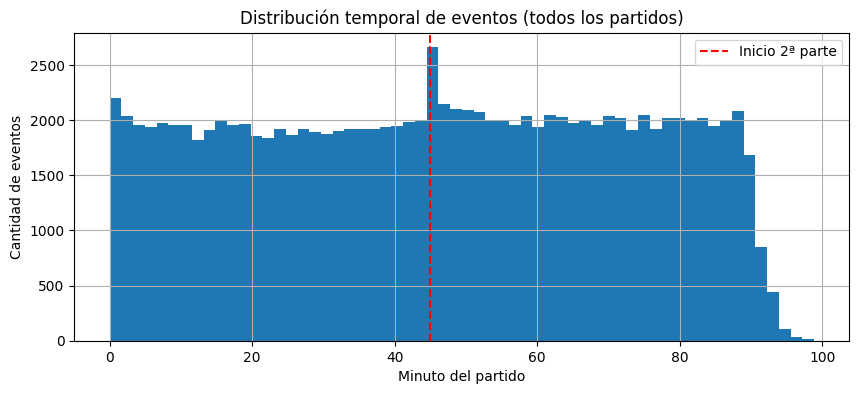

In [ ]:
# Distribución temporal de los eventos
# Convertir a minutos reales desde el inicio del partido
times_min = []
for event in all_annotations:
    ms = int(event["position"])
    min_rel = ms / 60000
    min_abs = min_rel + 45 if event["gameTime"].startswith("2") else min_rel
    times_min.append(min_abs)

# Graficar histograma
plt.figure(figsize=(10, 4))
plt.hist(times_min, bins=60)
plt.title("Distribución temporal de eventos (todos los partidos)")
plt.xlabel("Minuto del partido")
plt.ylabel("Cantidad de eventos")
plt.axvline(45, color='red', linestyle='--', label='Inicio 2ª parte')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
# Convertir a DataFrame
import pandas as pd

df_all = pd.DataFrame(all_annotations)
df_all["minute"] = df_all["position"].astype(int) / 60000
df_all["minute_abs"] = df_all.apply(
    lambda row: row["minute"] + 45 if row["gameTime"].startswith("2") else row["minute"],
    axis=1
)

# Frecuencia total por tipo de evento
event_counts = df_all["label"].value_counts()
print("Frecuencia total por tipo de evento:\n")
print(event_counts)

Frecuencia total por tipo de evento:

label
Ball out of play      31810
Throw-in              18918
Foul                  11674
Indirect free-kick    10521
Clearance              7896
Shots on target        5820
Shots off target       5256
Corner                 4836
Substitution           2839
Kick-off               2566
Direct free-kick       2200
Offside                2098
Yellow card            2047
Goal                   1703
Penalty                 173
Red card                 55
Yellow->red card         46
Name: count, dtype: int64


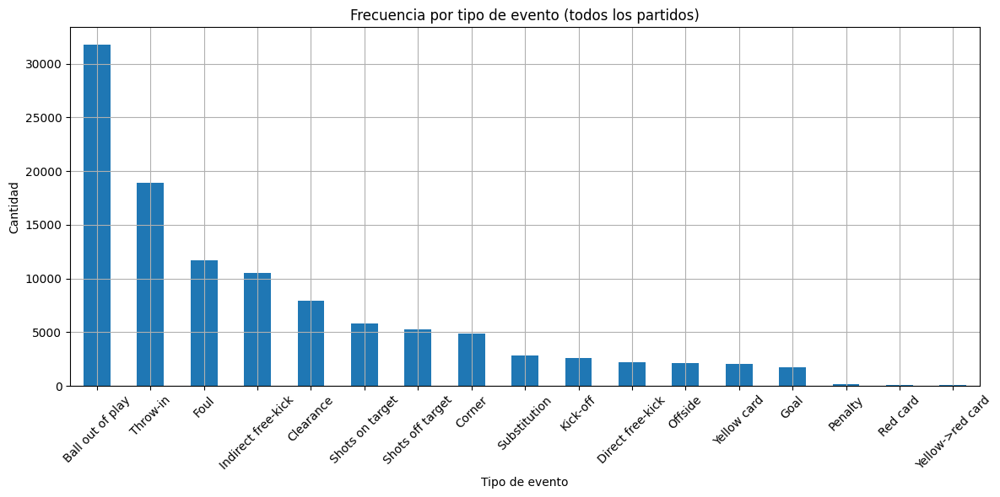

In [ ]:
# Visualizar las frecuencias
plt.figure(figsize=(12, 6))
event_counts.plot(kind="bar")
plt.title("Frecuencia por tipo de evento (todos los partidos)")
plt.xlabel("Tipo de evento")
plt.ylabel("Cantidad")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

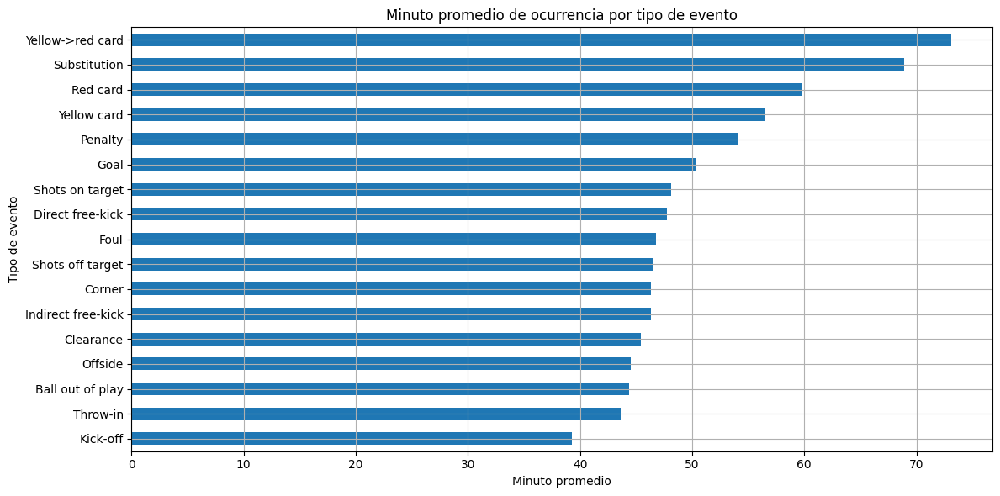

In [ ]:
# Distribución temporal por tipo de evento
avg_time_per_event = df_all.groupby("label")["minute_abs"].mean().sort_values()

plt.figure(figsize=(12, 6))
avg_time_per_event.plot(kind="barh")
plt.title("Minuto promedio de ocurrencia por tipo de evento")
plt.xlabel("Minuto promedio")
plt.ylabel("Tipo de evento")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Eventos por equipo
team_event_counts = pd.crosstab(df_all["label"], df_all["team"])

print("Eventos por tipo y equipo:")
print(team_event_counts)

Eventos por tipo y equipo:
team                away  home  not applicable
label                                         
Ball out of play       0     0           31810
Clearance           4403  3493               0
Corner              2090  2746               0
Direct free-kick     993  1207               0
Foul                5892  5782               0
Goal                 739   964               0
Indirect free-kick  5421  5100               0
Kick-off            1377  1189               0
Offside              980  1118               0
Penalty               67   106               0
Red card              29    26               0
Shots off target    2404  2852               0
Shots on target     2528  3292               0
Substitution        1418  1421               0
Throw-in            9284  9634               0
Yellow card         1091   956               0
Yellow->red card      27    19               0


In [ ]:
# Distribución por mitad del partido
df_all["half"] = df_all["gameTime"].str[0].astype(int)

events_by_half = pd.crosstab(df_all["label"], df_all["half"])

print("Frecuencia de eventos por tipo y mitad del partido:")
print(events_by_half)

Frecuencia de eventos por tipo y mitad del partido:
half                    1      2
label                           
Ball out of play    16183  15627
Clearance            3979   3917
Corner               2331   2505
Direct free-kick     1050   1150
Foul                 5655   6019
Goal                  718    985
Indirect free-kick   5198   5323
Kick-off             1175   1391
Offside              1072   1026
Penalty                66    107
Red card               16     39
Shots off target     2554   2702
Shots on target      2646   3174
Substitution          129   2710
Throw-in             9810   9108
Yellow card           721   1326
Yellow->red card        4     42


## Tratamiento de datos

In [ ]:
# Almacenar solamente las clases importantes
import os
import json
import pandas as pd
from SoccerNet.utils import getListGames
from tqdm import tqdm

# Ruta base en Google Drive
base_path = "/content/drive/MyDrive/SoccerNet"

# Clases seleccionadas (relevantes para análisis táctico)
clases_validas = [
    # "Red card",
    # "Yellow->red card",
    # "Penalty",
    "Yellow card",
    "Goal",
    "Substitution",
    # "Offside",
    "Corner",
    # "Shots off target",
    # "Shots on target"
]

# Unificación de nombres: convertir "Yellow->red card" a "Red card"
mapeo_clases = {
    "Yellow->red card": "Red card"
}

# Cargar todos los partidos
all_games = getListGames(split=["train", "valid", "test"])

# Almacenar eventos filtrados
eventos_filtrados = []

for game in tqdm(all_games, desc="Filtrando eventos"):
    label_path = os.path.join(base_path, game, "Labels-v2.json")
    if not os.path.exists(label_path):
        continue
    with open(label_path, "r") as f:
        data = json.load(f)
        annotations = data.get("annotations", [])
        for ann in annotations:
            label_original = ann["label"]
            # Renombrar si está en el mapeo
            label_normalizado = mapeo_clases.get(label_original, label_original)
            if label_normalizado in clases_validas:
                evento = {
                    "game": game,
                    "half": int(ann["gameTime"][0]),  # 1 o 2
                    "time_ms": int(ann["position"]),
                    "label": label_normalizado,
                    "team": ann["team"],
                    "visibility": ann["visibility"]
                }
                eventos_filtrados.append(evento)

# Convertir a DataFrame para facilitar el análisis posterior
df_eventos = pd.DataFrame(eventos_filtrados)
print(f"Total de eventos filtrados: {len(df_eventos)}")
print(df_eventos["label"].value_counts())

Filtrando eventos: 100%|██████████| 500/500 [03:28<00:00,  2.40it/s]

Total de eventos filtrados: 11425
label
Corner          4836
Substitution    2839
Yellow card     2047
Goal            1703
Name: count, dtype: int64


In [ ]:
# Eliminar los eventos sin visibilidad
# Eliminar eventos no visibles
df_eventos = df_eventos[df_eventos["visibility"] == "visible"].reset_index(drop=True)

# Mostrar resultados finales
print(f"Total de eventos filtrados y visibles: {len(df_eventos)}")
print(df_eventos["label"].value_counts())

Total de eventos filtrados y visibles: 10138
label
Corner          4229
Substitution    2341
Yellow card     1866
Goal            1702
Name: count, dtype: int64


In [ ]:
# Añadir la ruta del vídeo correspondiente al evento
def get_video_path(row):
    half_name = "1_720p.mkv" if row["half"] == 1 else "2_720p.mkv"
    return os.path.join(base_path, row["game"], half_name)

df_eventos["video_path"] = df_eventos.apply(get_video_path, axis=1)
df_eventos

,game,half,time_ms,label,team,visibility,video_path
0,england_epl/2014-2015/2015-02-21 - 18-00 Chels...,1,182775,Corner,away,visible,/content/drive/MyDrive/SoccerNet/england_epl/2...
1,england_epl/2014-2015/2015-02-21 - 18-00 Chels...,1,292492,Corner,home,visible,/content/drive/MyDrive/SoccerNet/england_epl/2...
2,england_epl/2014-2015/2015-02-21 - 18-00 Chels...,1,790722,Goal,home,visible,/content/drive/MyDrive/SoccerNet/england_epl/2...
3,england_epl/2014-2015/2015-02-21 - 18-00 Chels...,1,880053,Corner,home,visible,/content/drive/MyDrive/SoccerNet/england_epl/2...
4,england_epl/2014-2015/2015-02-21 - 18-00 Chels...,1,971069,Corner,home,visible,/content/drive/MyDrive/SoccerNet/england_epl/2...
...,...,...,...,...,...,...,...
10133,spain_laliga/2016-2017/2017-04-26 - 20-30 Barc...,2,1629131,Corner,home,visible,/content/drive/MyDrive/SoccerNet/spain_laliga/...
10134,spain_laliga/2016-2017/2017-04-26 - 20-30 Barc...,2,2024636,Substitution,away,visible,/content/drive/MyDrive/SoccerNet/spain_laliga/...
10135,spain_laliga/2016-2017/2017-04-26 - 20-30 Barc...,2,2137465,Corner,away,visible,/content/drive/MyDrive/SoccerNet/spain_laliga/...
10136,spain_laliga/2016-2017/2017-04-26 - 20-30 Barc...,2,2442000,Goal,home,visible,/content/drive/MyDrive/SoccerNet/spain_laliga/...


In [ ]:
# Calcular el número de frame correspondiente al time_ms
FPS = 25
MS_PER_FRAME = 1000 / FPS  # = 40.0

df_eventos["frame_number"] = (df_eventos["time_ms"] / MS_PER_FRAME).astype(int)
df_eventos

,game,half,time_ms,label,team,visibility,video_path,frame_number
0,england_epl/2014-2015/2015-02-21 - 18-00 Chels...,1,182775,Corner,away,visible,/content/drive/MyDrive/SoccerNet/england_epl/2...,4569
1,england_epl/2014-2015/2015-02-21 - 18-00 Chels...,1,292492,Corner,home,visible,/content/drive/MyDrive/SoccerNet/england_epl/2...,7312
2,england_epl/2014-2015/2015-02-21 - 18-00 Chels...,1,790722,Goal,home,visible,/content/drive/MyDrive/SoccerNet/england_epl/2...,19768
3,england_epl/2014-2015/2015-02-21 - 18-00 Chels...,1,880053,Corner,home,visible,/content/drive/MyDrive/SoccerNet/england_epl/2...,22001
4,england_epl/2014-2015/2015-02-21 - 18-00 Chels...,1,971069,Corner,home,visible,/content/drive/MyDrive/SoccerNet/england_epl/2...,24276
...,...,...,...,...,...,...,...,...
10133,spain_laliga/2016-2017/2017-04-26 - 20-30 Barc...,2,1629131,Corner,home,visible,/content/drive/MyDrive/SoccerNet/spain_laliga/...,40728
10134,spain_laliga/2016-2017/2017-04-26 - 20-30 Barc...,2,2024636,Substitution,away,visible,/content/drive/MyDrive/SoccerNet/spain_laliga/...,50615
10135,spain_laliga/2016-2017/2017-04-26 - 20-30 Barc...,2,2137465,Corner,away,visible,/content/drive/MyDrive/SoccerNet/spain_laliga/...,53436
10136,spain_laliga/2016-2017/2017-04-26 - 20-30 Barc...,2,2442000,Goal,home,visible,/content/drive/MyDrive/SoccerNet/spain_laliga/...,61050


In [ ]:
# Guardar el DataFrame como CSV
df_eventos.to_csv("/content/drive/MyDrive/SoccerNet/eventos_filtrados_milisegundos.csv", index=False)

In [ ]:
# Guardar los frames en una ventana de 2 segundos (1 segundo previo y 1 posterior) para cada evento
import cv2
import os
import pandas as pd
from tqdm import tqdm

# Parámetros
frames_dir = "/content/drive/MyDrive/SoccerNet_FramesByEvent"
registro_path = "/content/drive/MyDrive/SoccerNet_eventos_procesados.csv"
ventana_segundos = 1
fps_lectura = 25
fps_muestreo = 2
intervalo = int(fps_lectura / fps_muestreo)
frames_por_lado = ventana_segundos * fps_lectura

# Crear carpetas por clase (una vez)
for label in df_eventos["label"].unique():
    carpeta = os.path.join(frames_dir, label.replace(" ", "_"))
    os.makedirs(carpeta, exist_ok=True)

# Cargar eventos ya procesados
if os.path.exists(registro_path):
    registro = pd.read_csv(registro_path)
    ya_procesados = set(registro["id_evento"])
else:
    registro = pd.DataFrame(columns=["id_evento"])
    ya_procesados = set()

# Recorrer todos los eventos
for idx, row in tqdm(df_eventos.iterrows(), total=len(df_eventos), desc="Procesando eventos"):
    evento_id = row['game'].split('/')[-1].replace(' ', '_').replace(':', '_')[:30]
    evento_id += f"_H{row['half']}_T{row['time_ms']}"

    if evento_id in ya_procesados:
        continue

    video_path = row["video_path"]
    frame_central = row["frame_number"]
    label = row["label"].replace(" ", "_")
    label_dir = os.path.join(frames_dir, label)
    os.makedirs(label_dir, exist_ok=True)

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"No se pudo abrir: {video_path}")
        continue

    frames_guardados = 0
    for i in range(-frames_por_lado, frames_por_lado + 1, intervalo):
        frame_actual = frame_central + i
        if frame_actual < 0:
            continue

        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_actual)
        ret, frame = cap.read()
        if not ret:
            continue

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame_name = f"{evento_id}_f{i + frames_por_lado:02d}.jpg"
        save_path = os.path.join(label_dir, frame_name)

        success = cv2.imwrite(save_path, cv2.cvtColor(frame_rgb, cv2.COLOR_RGB2BGR))
        if success:
            frames_guardados += 1
            print(f"✅ Guardado correctamente: {save_path}")
        else:
            print(f"❌ Falló al guardar: {save_path}")
        print(f"📝 Existe en disco: {os.path.exists(save_path)} - Longitud ruta: {len(save_path)}")

    cap.release()

    if frames_guardados >= 1:
        # Guardar el evento procesado inmediatamente
        registro = pd.concat([registro, pd.DataFrame([{"id_evento": evento_id}])], ignore_index=True)
        registro.to_csv(registro_path, index=False)
    else:
        print(f"Clip muy corto o con errores: {evento_id}")

Procesando eventos: 100%|██████████| 10138/10138 [00:00<00:00, 12193.22it/s]


In [ ]:
# Comprobar que se han guardado imágenes de todos los eventos
import os
from collections import defaultdict

# Ruta principal
frames_dir = "/content/drive/MyDrive/SoccerNet_FramesByEvent"

conteo_total = 0
conteo_por_clase = defaultdict(int)

# Recorrer subdirectorios
for root, dirs, files in os.walk(frames_dir):
    for file in files:
        if file.lower().endswith(".jpg"):
            conteo_total += 1
            clase = os.path.basename(root)  # nombre de la carpeta (clase)
            conteo_por_clase[clase] += 1

# Mostrar resultados
print(f"Total de imágenes: {conteo_total}")
print("\nImágenes por clase:")
for clase, n in sorted(conteo_por_clase.items(), key=lambda x: x[0]):
    print(f"  {clase}: {n}")

Total de imágenes: 50563

Imágenes por clase:
  Corner: 21145
  Goal: 8500
  Substitution: 11598
  Yellow_card: 9320


In [ ]:
registro_path = "/content/drive/MyDrive/SoccerNet_eventos_procesados.csv"
import pandas as pd

registro = pd.read_csv(registro_path)
print(f"Total de eventos procesados: {len(registro)}")

Total de eventos procesados: 10138


In [ ]:
# Generar nuevo CSV con rutas de los frames de cada evento
import os
import pandas as pd
from glob import glob

# Carpeta donde están los frames clasificados por evento
frames_dir = "/content/drive/MyDrive/SoccerNet_FramesByEvent"

# Recorrer todas las carpetas de clase
eventos_dict = {}

for clase in os.listdir(frames_dir):
    clase_path = os.path.join(frames_dir, clase)
    if not os.path.isdir(clase_path):
        continue

    # Buscar imágenes .jpg dentro de esta clase
    archivos = glob(os.path.join(clase_path, "*.jpg"))

    for path in archivos:
        nombre = os.path.basename(path)
        # Extraer el id_evento (sin _fXX.jpg)
        try:
            evento_id = "_".join(nombre.split("_")[:-1])  # elimina _f00.jpg, etc.
        except:
            continue

        if evento_id not in eventos_dict:
            eventos_dict[evento_id] = {
                "id_evento": evento_id,
                "clase": clase,
                "frames": []
            }

        eventos_dict[evento_id]["frames"].append(path)

# Crear lista de filas para el DataFrame
rows = []
for evento in eventos_dict.values():
    frames_ordenados = sorted(evento["frames"])  # asegurar orden temporal
    fila = {
        "id_evento": evento["id_evento"],
        "clase": evento["clase"]
    }
    for i, frame_path in enumerate(frames_ordenados):
        fila[f"frame_{i}"] = frame_path
    rows.append(fila)

# Convertir a DataFrame
df_clips = pd.DataFrame(rows)

# Guardar como CSV
csv_path = "/content/drive/MyDrive/SoccerNet_eventos_clips.csv"
df_clips.to_csv(csv_path, index=False)

print(f"CSV generado con {len(df_clips)} eventos: {csv_path}")

CSV generado con 10126 eventos: /content/drive/MyDrive/SoccerNet_eventos_clips.csv


In [ ]:
# Comprobar eventos sin frames
import pandas as pd

# Cargar ambos CSVs
csv_procesados = "/content/drive/MyDrive/SoccerNet_eventos_procesados.csv"
csv_clips = "/content/drive/MyDrive/SoccerNet_eventos_clips.csv"

df_procesados = pd.read_csv(csv_procesados)
df_clips = pd.read_csv(csv_clips)

# Obtener sets de id_evento
ids_procesados = set(df_procesados["id_evento"])
ids_con_clips = set(df_clips["id_evento"])

# Detectar diferencias
faltantes = sorted(ids_procesados - ids_con_clips)

print(f"Eventos procesados sin clips guardados: {len(faltantes)}")
for eid in faltantes:
    print(eid)

Eventos procesados sin clips guardados: 0


In [ ]:
# Comprobar eventos duplicados
# Verificar duplicados por id_evento
duplicados_procesados = df_procesados[df_procesados.duplicated("id_evento", keep=False)]
duplicados_clips = df_clips[df_clips.duplicated("id_evento", keep=False)]

print(f"Duplicados en eventos procesados: {len(duplicados_procesados)}")
print(f"Duplicados en eventos con clips: {len(duplicados_clips)}")

Duplicados en eventos procesados: 24
Duplicados en eventos con clips: 0


Evento seleccionado: 2016-11-27_-_22-45_Real_Socied_H2_T2589040 - Clase: Yellow_card


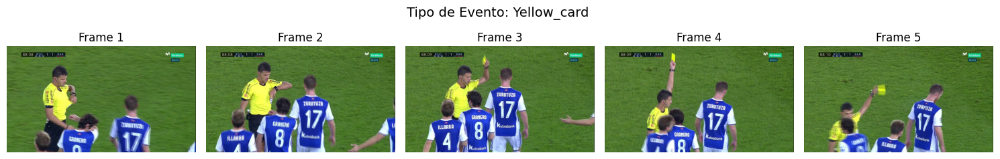

In [ ]:
# Mostrar los 5 frames de un evento al azar
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

# Elegir un evento aleatorio del dataset
evento_random = df_clips.sample(1).iloc[0]
print(f"Evento seleccionado: {evento_random['id_evento']} - Clase: {evento_random['clase']}")

# Obtener las rutas de los frames
frame_paths = [evento_random[f"frame_{i}"] for i in range(5) if f"frame_{i}" in evento_random]

# Mostrar los 5 frames en una fila
plt.figure(figsize=(15, 4))
for i, frame_path in enumerate(frame_paths):
    img = mpimg.imread(frame_path)
    plt.subplot(1, 5, i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Frame {i+1}")
plt.suptitle(f"Tipo de Evento: {evento_random['clase']} ", fontsize=14, y=0.77)
plt.tight_layout(rect=[0, 0.03, 1, 0.90])
plt.show()

## Aplicar YOLO para detección de objetos

### Aplicación de YOLO

In [ ]:
# Instalar YOLO v5
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17493, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 17493 (delta 1), reused 0 (delta 0), pack-reused 17490 (from 3)
Receiving objects: 100% (17493/17493), 16.54 MiB | 29.40 MiB/s, done.
Resolving deltas: 100% (11989/11989), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 54.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 46.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.8 MB/s eta 0:00

In [ ]:
# Cargar el CSV de eventos con rutas de los frames
import pandas as pd

csv_path = "/content/drive/MyDrive/SoccerNet_eventos_clips.csv"
df_clips = pd.read_csv(csv_path)
df_clips["num_frames"] = df_clips.filter(like="frame_").notna().sum(axis=1)
df_clips.head()

,id_evento,clase,frame_0,frame_1,frame_2,frame_3,frame_4,num_frames
0,2017-05-14_-_16-00_Torino_0_-__H1_T290553,Corner,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,5
1,2017-05-14_-_16-00_Torino_0_-__H1_T640704,Corner,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,5
2,2017-05-14_-_16-00_Torino_0_-__H1_T757377,Corner,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,5
3,2017-05-14_-_16-00_Torino_0_-__H1_T1713401,Corner,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,5
4,2017-05-14_-_16-00_Torino_0_-__H2_T766017,Corner,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,/content/drive/MyDrive/SoccerNet_FramesByEvent...,5


In [ ]:
# Cargar modelo YOLOv5 preentrenado
import torch
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

/usr/local/lib/python3.11/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


YOLOv5 🚀 2025-6-21 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

100%|██████████| 14.1M/14.1M [00:00<00:00, 161MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [ ]:
# Aplicar YOLOv5 y guardar resultados (persistencia)
import os
import json
import pandas as pd
from tqdm import tqdm
import torch
import time
from pathlib import Path

# Carpeta donde guardar los resultados de detección
detections_dir = "/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2"
os.makedirs(detections_dir, exist_ok=True)

# Guardar los resultados por evento en un CSV incremental
csv_resultados = os.path.join(detections_dir, "detecciones_yolo.csv")
json_eventos_path = os.path.join(detections_dir, "tiempos_eventos.json")
json_frames_path = os.path.join(detections_dir, "tiempos_frames.json")

# Evitar procesar eventos ya detectados
if os.path.exists(csv_resultados):
    df_resultados = pd.read_csv(csv_resultados)
    eventos_procesados = set(df_resultados["id_evento"])
else:
    df_resultados = pd.DataFrame(columns=["id_evento", "frame", "detections"])
    eventos_procesados = set()

# Cargar tiempos anteriores si existen
if os.path.exists(json_eventos_path):
    with open(json_eventos_path, "r") as f:
        tiempos_eventos = json.load(f)
else:
    tiempos_eventos = []

if os.path.exists(json_frames_path):
    with open(json_frames_path, "r") as f:
        tiempos_frames = json.load(f)
else:
    tiempos_frames = []

resultados_nuevos = []

# Aplicar detección sobre todos los frames de cada evento
for idx, row in tqdm(df_clips.iterrows(), total=len(df_clips), desc="Detección YOLOv5"):
    evento_id = row["id_evento"]
    if evento_id in eventos_procesados:
        continue

    t_evento_inicio = time.time()

    for col in row.index:
        if not col.startswith("frame_"):
            continue
        path_frame = row[col]
        if pd.isna(path_frame) or not os.path.exists(path_frame):
            print(f"❌ No existe: {path_frame}")
            continue

        # Tiempo de inferencia por frame
        t_frame_inicio = time.time()
        results = model(path_frame)
        t_frame_fin = time.time()
        tiempos_frames.append(t_frame_fin - t_frame_inicio)

        detecciones = results.pandas().xyxy[0]
        detecciones_str = detecciones.to_json(orient="records")
        resultados_nuevos.append({
            "id_evento": evento_id,
            "frame": os.path.basename(path_frame),
            "detections": detecciones_str
        })

    t_evento_fin = time.time()
    tiempo_evento = t_evento_fin - t_evento_inicio
    tiempos_eventos.append(tiempo_evento)
    print(f"🕒 Evento {evento_id} procesado en {tiempo_evento:.2f} s")

    # Guardar resultados acumulados periódicamente
    if len(resultados_nuevos) >= 10:
        df_temp = pd.DataFrame(resultados_nuevos)
        df_resultados = pd.concat([df_resultados, df_temp], ignore_index=True)
        df_resultados.to_csv(csv_resultados, index=False)
        resultados_nuevos = []

        # Guardar tiempos acumulados
        with open(json_eventos_path, "w") as f:
            json.dump(tiempos_eventos, f)
        with open(json_frames_path, "w") as f:
            json.dump(tiempos_frames, f)

# Guardar lo que quede
if resultados_nuevos:
    df_temp = pd.DataFrame(resultados_nuevos)
    df_resultados = pd.concat([df_resultados, df_temp], ignore_index=True)
    df_resultados.to_csv(csv_resultados, index=False)

# Guardar tiempos finales
with open(json_eventos_path, "w") as f:
    json.dump(tiempos_eventos, f)
with open(json_frames_path, "w") as f:
    json.dump(tiempos_frames, f)

print("✅ Detección completada y guardada.")

# 🧠 Mostrar estadísticas de tiempo
if tiempos_eventos:
    print(f"\n📊 Estadísticas de tiempo:")
    print(f"- Eventos procesados: {len(tiempos_eventos)}")
    print(f"- Tiempo medio por evento: {sum(tiempos_eventos) / len(tiempos_eventos):.2f} s")
    print(f"- Tiempo medio por frame: {sum(tiempos_frames) / len(tiempos_frames):.2f} s")

Detección YOLOv5: 100%|██████████| 10126/10126 [00:00<00:00, 27946.68it/s]


✅ Detección completada y guardada.

📊 Estadísticas de tiempo:
- Eventos procesados: 10126
- Tiempo medio por evento: 3.04 s
- Tiempo medio por frame: 0.60 s


In [ ]:
# Añadir la clase del evento a cada frame
import pandas as pd

# Rutas
csv_resultados = "/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2/detecciones_yolo.csv"
csv_etiquetas = "/content/drive/MyDrive/SoccerNet_eventos_clips.csv"

# Cargar CSV con detecciones existentes
df_detecciones = pd.read_csv(csv_resultados)

# Cargar DataFrame con clases de evento
df_etiquetas = pd.read_csv(csv_etiquetas)

# Confirmar nombres de columnas clave
assert "id_evento" in df_detecciones.columns
assert "id_evento" in df_etiquetas.columns
assert "clase" in df_etiquetas.columns  # Asegúrate de que esta es la columna con el nombre de clase

# Hacer el merge para añadir la clase a cada fila de detección
df_detecciones = df_detecciones.merge(df_etiquetas[["id_evento", "clase"]], on="id_evento", how="left")

# Guardar el CSV actualizado
df_detecciones.to_csv(csv_resultados, index=False)

print("✅ Se ha añadido la columna 'clase' a detecciones_yolo.csv")

✅ Se ha añadido la columna 'clase' a detecciones_yolo.csv


### Análisis de resultados y evaluación de YOLO

In [ ]:
# Cargar datos y preparar estructuras
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from PIL import Image, ImageDraw
import numpy as np

# Rutas de persistencia
detections_dir = "/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2"
csv_path = os.path.join(detections_dir, "detecciones_yolo.csv")
json_eventos_path = os.path.join(detections_dir, "tiempos_eventos.json")
json_frames_path = os.path.join(detections_dir, "tiempos_frames.json")

# Cargar detecciones
df = pd.read_csv(csv_path)

# Cargar tiempos
with open(json_eventos_path, "r") as f:
    tiempos_eventos = json.load(f)
with open(json_frames_path, "r") as f:
    tiempos_frames = json.load(f)

print(f"🟢 Detecciones cargadas: {len(df)}")
print(f"🟢 Tiempos por evento: {len(tiempos_eventos)}, tiempos por frame: {len(tiempos_frames)}")

🟢 Detecciones cargadas: 50562
🟢 Tiempos por evento: 10126, tiempos por frame: 50352



🎯 Clases más detectadas:
- person: 533703 ocurrencias
- sports ball: 15042 ocurrencias
- chair: 4859 ocurrencias
- tennis racket: 3136 ocurrencias
- frisbee: 1123 ocurrencias
- tie: 726 ocurrencias
- baseball glove: 640 ocurrencias
- car: 413 ocurrencias
- baseball bat: 392 ocurrencias
- bottle: 258 ocurrencias


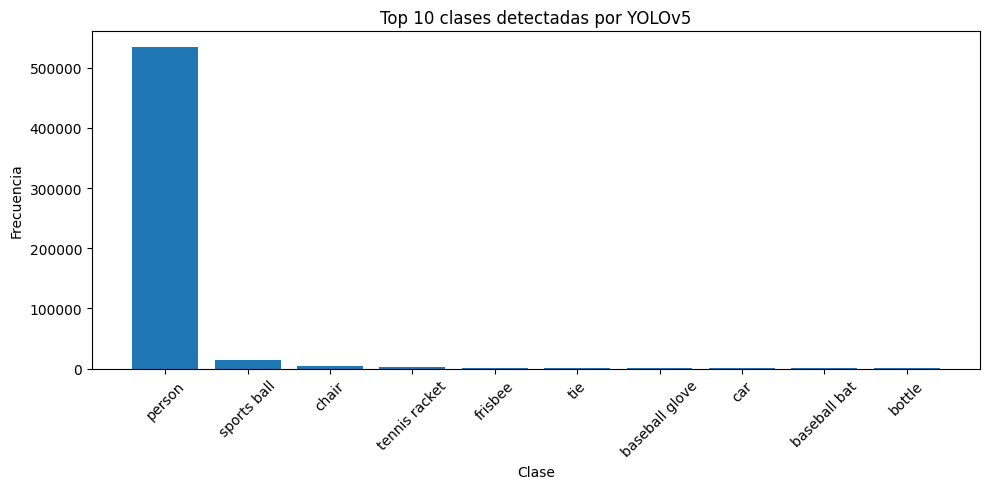

In [ ]:
# Clases detectadas y estadísticas básicas
# Obtener todos los objetos detectados
all_detections = []
for json_str in df["detections"]:
    try:
        detections = json.loads(json_str)
        for det in detections:
            all_detections.append(det["name"])  # nombre de clase
    except:
        continue

# Contar clases
conteo_clases = Counter(all_detections)

# Mostrar top clases
top_clases = conteo_clases.most_common(10)
print("\n🎯 Clases más detectadas:")
for clase, count in top_clases:
    print(f"- {clase}: {count} ocurrencias")

# Gráfico de barras
plt.figure(figsize=(10, 5))
plt.bar([c[0] for c in top_clases], [c[1] for c in top_clases])
plt.xticks(rotation=45)
plt.title("Top 10 clases detectadas por YOLOv5")
plt.xlabel("Clase")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()


📌 Detecciones promedio por frame: 11.13
📌 Detecciones promedio por evento: 55.56


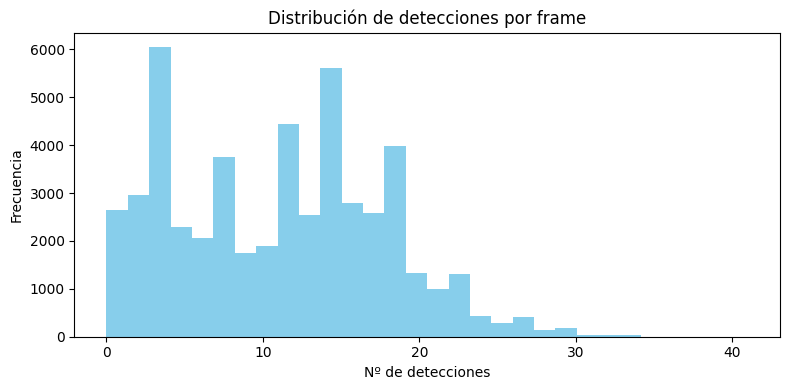

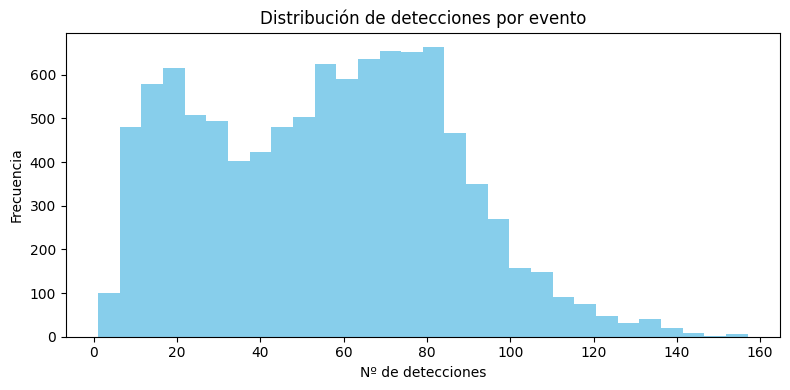

In [ ]:
# Estadísticas de detección por frame y evento
# Número de detecciones por frame
num_detecciones_por_frame = df["detections"].apply(lambda x: len(json.loads(x)))
promedio_detecciones = num_detecciones_por_frame.mean()

print(f"\n📌 Detecciones promedio por frame: {promedio_detecciones:.2f}")

# Detecciones por evento
detecciones_por_evento = df.groupby("id_evento")["detections"].apply(
    lambda dets: sum(len(json.loads(d)) for d in dets)
)
print(f"📌 Detecciones promedio por evento: {detecciones_por_evento.mean():.2f}")

# Histograma
plt.figure(figsize=(8, 4))
plt.hist(num_detecciones_por_frame, bins=30, color="skyblue")
plt.title("Distribución de detecciones por frame")
plt.xlabel("Nº de detecciones")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

# Histograma
plt.figure(figsize=(8, 4))
plt.hist(detecciones_por_evento, bins=30, color="skyblue")
plt.title("Distribución de detecciones por evento")
plt.xlabel("Nº de detecciones")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()


🖼️ Frame: 2015-11-07_-_22-45_AC_Milan_0__H2_T1914000_f00.jpg - Evento: 2015-11-07_-_22-45_AC_Milan_0__H2_T1914000


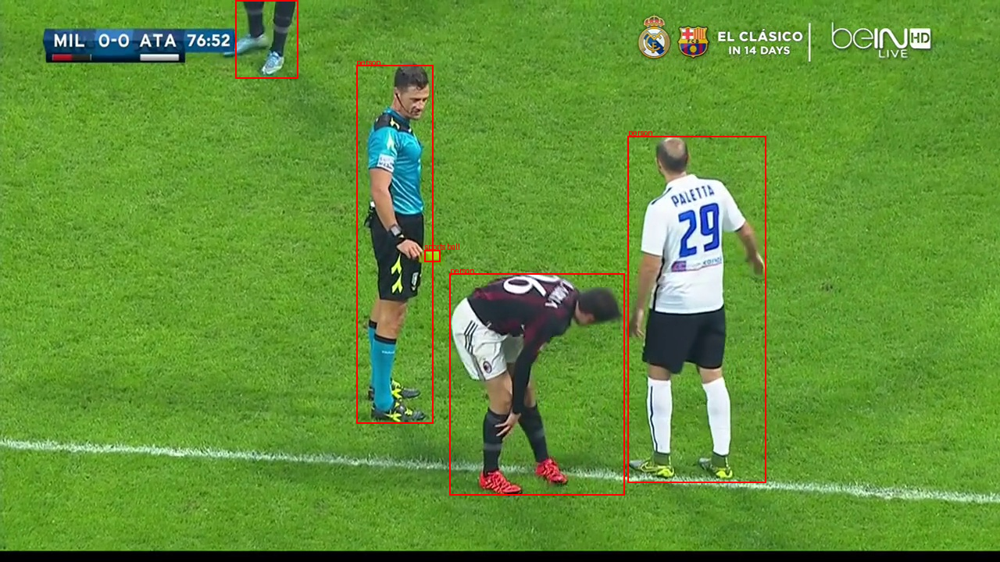


🖼️ Frame: 2016-10-02_-_21-45_Celta_Vigo__H2_T2437258_f48.jpg - Evento: 2016-10-02_-_21-45_Celta_Vigo__H2_T2437258


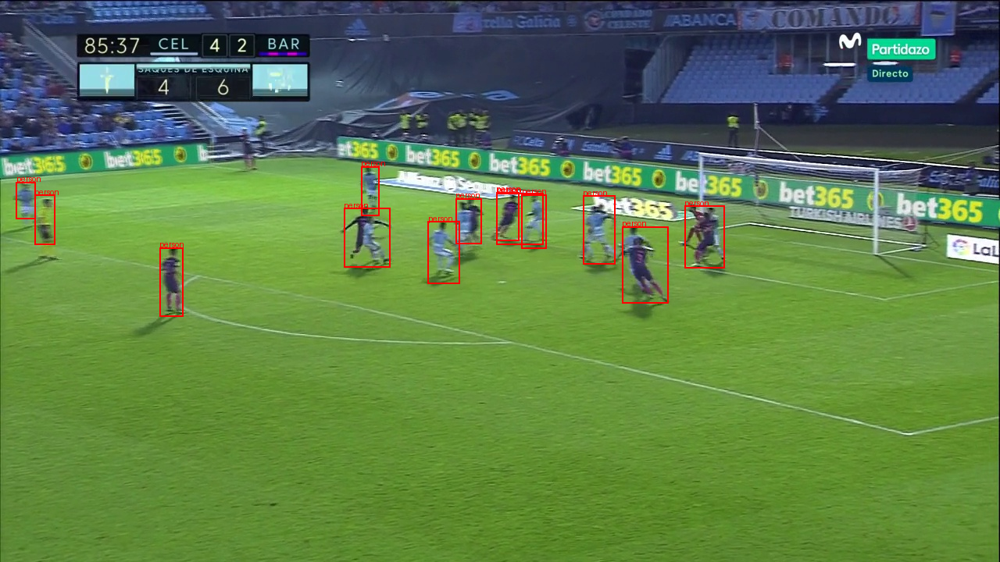


🖼️ Frame: 2015-11-03_-_18-00_FC_Astana_0_H1_T1598845_f24.jpg - Evento: 2015-11-03_-_18-00_FC_Astana_0_H1_T1598845


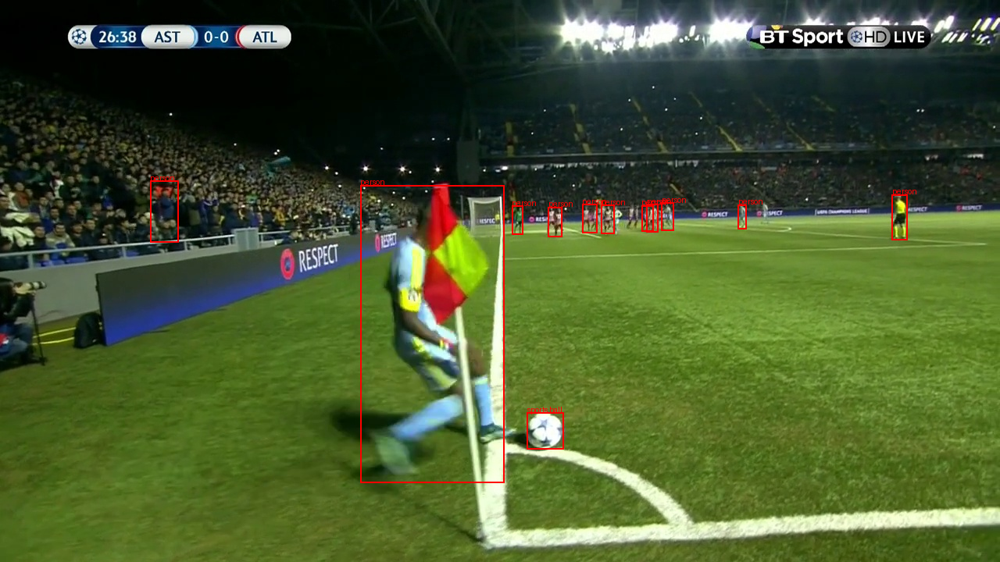

In [ ]:
# Visualización de detecciones sobre frames reales
from IPython.display import display

# Mostrar detecciones en N imágenes aleatorias
N = 3
sample = df.sample(N)

for _, row in sample.iterrows():
    detections = json.loads(row["detections"])
    frame_path = None

    # Buscar en Google Drive
    for base_dir in ["/content/drive/MyDrive/SoccerNet_FramesByEvent"]:
        for clase in os.listdir(base_dir):
            posible = os.path.join(base_dir, clase, row["frame"])
            if os.path.exists(posible):
                frame_path = posible
                break

    if frame_path and os.path.exists(frame_path):
        image = Image.open(frame_path).convert("RGB")
        draw = ImageDraw.Draw(image)
        for det in detections:
            xmin, ymin, xmax, ymax = det["xmin"], det["ymin"], det["xmax"], det["ymax"]
            label = det["name"]
            draw.rectangle([xmin, ymin, xmax, ymax], outline="red", width=2)
            draw.text((xmin, ymin - 10), label, fill="red")
        print(f"\n🖼️ Frame: {row['frame']} - Evento: {row['id_evento']}")
        display(image)

🧹 Eventos dentro del límite de 5 s: 9951
🗑️ Eventos excluidos: 175


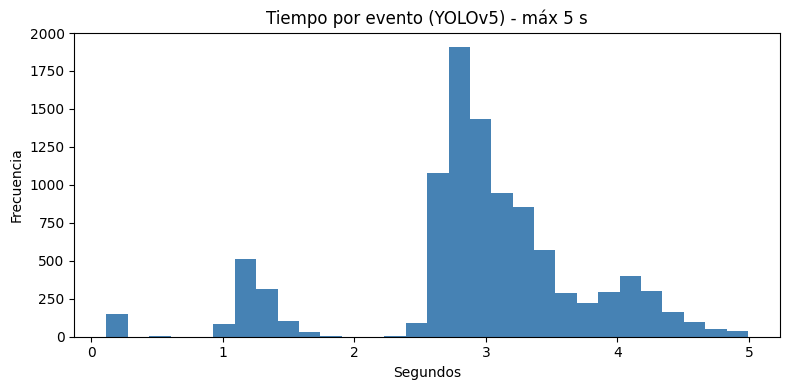

In [ ]:
# Análisis de tiempos de ejecución (máximo 5 segundos)
import matplotlib.pyplot as plt
import numpy as np

# Convertir a array y filtrar
tiempos_eventos_np = np.array(tiempos_eventos)
tiempos_filtrados = tiempos_eventos_np[tiempos_eventos_np <= 5]

print(f"🧹 Eventos dentro del límite de 5 s: {len(tiempos_filtrados)}")
print(f"🗑️ Eventos excluidos: {len(tiempos_eventos_np) - len(tiempos_filtrados)}")

# Gráfico
plt.figure(figsize=(8, 4))
plt.hist(tiempos_filtrados, bins=30, color="steelblue")
plt.title("Tiempo por evento (YOLOv5) - máx 5 s")
plt.xlabel("Segundos")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

## Tratamiento Post-YOLO y Pre-CNN

In [ ]:
# Definir las clases relevantes en el contexto de fútbol y parámetros clave
CLASES_RELEVANTES = {"person", "sports ball"}

# Asignar IDs numéricos
MAPA_CLASES = {
    "person": 0,
    "sports ball": 1
}

# Parámetros del tensor
N_FRAMES = 5                  # Por evento
MAX_DETECCIONES = 25          # Detecciones máximas por frame
VECTOR_SIZE = 5               # [class_id, x_center, y_center, width, height]

# Tamaño de los frames para normalizar (ajusta si tus frames tienen otro tamaño)
FRAME_WIDTH = 1920
FRAME_HEIGHT = 1080

In [ ]:
# Función para convertir detecciones a tensor por evento
import numpy as np
import json

def detecciones_a_tensor_evento(df_evento):
    """
    Convierte las detecciones de un evento a un tensor de shape (5, 25, 5)
    """

    tensor_evento = np.zeros((N_FRAMES, MAX_DETECCIONES, VECTOR_SIZE), dtype=np.float32)

    for i, (_, row) in enumerate(df_evento.iterrows()):
        if i >= N_FRAMES:
            break  # solo los primeros 5 frames

        try:
            detecciones = json.loads(row["detections"])
        except:
            continue

        # Filtrar por clases relevantes
        detecciones_filtradas = [
            d for d in detecciones if d["name"] in CLASES_RELEVANTES
        ]

        # Si no hay detecciones relevantes, saltar ese frame
        if not detecciones_filtradas:
            continue

        # Ordenar por confianza (si existe)
        if "confidence" in detecciones_filtradas[0]:
            detecciones_filtradas.sort(key=lambda x: x["confidence"], reverse=True)

        # Tomar hasta MAX_DETECCIONES
        for j, det in enumerate(detecciones_filtradas[:MAX_DETECCIONES]):
            class_id = MAPA_CLASES[det["name"]]
            x_center = (det["xmin"] + det["xmax"]) / 2 / FRAME_WIDTH
            y_center = (det["ymin"] + det["ymax"]) / 2 / FRAME_HEIGHT
            width = (det["xmax"] - det["xmin"]) / FRAME_WIDTH
            height = (det["ymax"] - det["ymin"]) / FRAME_HEIGHT

            tensor_evento[i, j] = [class_id, x_center, y_center, width, height]

    return tensor_evento

In [ ]:

# Generar todos los tensores y guardarlos
from tqdm import tqdm
import pandas as pd

# DataFrame con detecciones YOLOv5
df_detecciones = pd.read_csv("/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2/detecciones_yolo.csv")

# Cargar etiquetas de eventos (asumiendo un CSV con columnas: id_evento, clase)
# df_etiquetas = pd.read_csv("/content/drive/MyDrive/SoccerNet_eventos_clips.csv")

# Contenedores
vectores_evento = []
clases_evento = []
eventos_validos = []
eventos_invalidos = []

# Procesar uno a uno
for id_evento, df_evento in tqdm(df_detecciones.groupby("id_evento"), desc="Procesando eventos"):

    # Validar que haya exactamente N_FRAMES
    if len(df_evento) != N_FRAMES:
        eventos_invalidos.append(id_evento)
        continue

    # Convertir a tensor
    tensor = detecciones_a_tensor_evento(df_evento)

    # Validar que al menos 1 frame tenga detecciones válidas
    if np.sum(tensor) == 0:
        eventos_invalidos.append(id_evento)
        continue

    vectores_evento.append(tensor)
    eventos_validos.append(id_evento)

    # Obtener clase del evento
    # fila_etiqueta = df_etiquetas[df_etiquetas["id_evento"] == id_evento]
    # if len(fila_etiqueta) != 1:
    #     eventos_invalidos.append(id_evento)
    #     continue

    # clase = fila_etiqueta.iloc[0]["clase"]
    # clases_evento.append(clase)

    # Obtener clase del evento
    clase = df_evento["clase"].iloc[0]
    clases_evento.append(clase)

print(f"✅ Eventos válidos: {len(vectores_evento)}")
print(f"❌ Eventos descartados: {len(eventos_invalidos)}")

Procesando eventos: 100%|██████████| 10126/10126 [00:06<00:00, 1561.57it/s]

✅ Eventos válidos: 10101
❌ Eventos descartados: 25


In [ ]:
# Convertir y guardar en formato .npy los eventos válidos
# Convertir lista de tensores a array numpy
vectores_array = np.stack(vectores_evento)  # shape: (n_eventos, 5, 25, 5)

# Guardar tensores
np.save("/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2/vectores_evento.npy", vectores_array)

# Guardar CSV con clases y ID de evento válidos
df_etiquetas_filtrado = pd.DataFrame({
    "id_evento": eventos_validos,
    "clase": clases_evento
})

df_etiquetas_filtrado.to_csv("/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2/etiquetas_evento.csv", index=False)

In [ ]:
# Verificar dimensiones
print(f"Shape del dataset final: {vectores_array.shape}")  # (10101, 5, 25, 5)
print(f"Ejemplo de tensor para evento 0:\n", vectores_array[0])

Shape del dataset final: (10101, 5, 25, 5)
Ejemplo de tensor para evento 0:
 [[[1.         0.11605836 0.62336314 0.03800553 0.06205252]
  [0.         0.5075149  0.3540655  0.13401788 0.49018973]
  [0.         0.5924067  0.23430142 0.08076198 0.153423  ]
  [0.         0.         0.         0.         0.        ]
  [0.         0.         0.         0.         0.        ]
  [0.         0.         0.         0.         0.        ]
  [0.         0.         0.         0.         0.        ]
  [0.         0.         0.         0.         0.        ]
  [0.         0.         0.         0.         0.        ]
  [0.         0.         0.         0.         0.        ]
  [0.         0.         0.         0.         0.        ]
  [0.         0.         0.         0.         0.        ]
  [0.         0.         0.         0.         0.        ]
  [0.         0.         0.         0.         0.        ]
  [0.         0.         0.         0.         0.        ]
  [0.         0.         0.         0.

## Aplicar CNN para clasificación de eventos

### División y preparación de conjuntos de datos

In [ ]:
# División en train / val / test
from sklearn.model_selection import train_test_split

# Cargar los tensores y etiquetas
import numpy as np
import pandas as pd

X = np.load("/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2/vectores_evento.npy")
df_labels = pd.read_csv("/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2/etiquetas_evento.csv")

# Convertir etiquetas a índices (categorías)
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y = le.fit_transform(df_labels["clase"])  # Numérico

# Guardar el encoder por si se necesita más tarde
import joblib
joblib.dump(le, "/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2/label_encoder.pkl")

# Dividir: 70% train, 15% val, 15% test
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.15, random_state=42, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.1765, random_state=42, stratify=y_temp)

# Confirmar proporciones
print(f"Train: {X_train.shape}, Val: {X_val.shape}, Test: {X_test.shape}")

Train: (7069, 5, 25, 5), Val: (1516, 5, 25, 5), Test: (1516, 5, 25, 5)


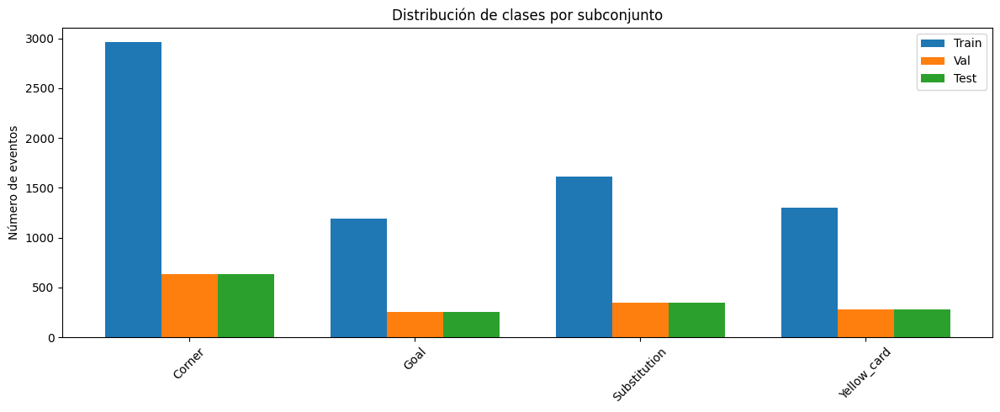

In [ ]:
# Visualizar la distribución de clases en cada conjunto
import matplotlib.pyplot as plt
import numpy as np

# Recuperar nombres de clases
clases = le.classes_

# Contar por subconjunto
def contar_etiquetas(y, clases):
    return np.bincount(y, minlength=len(clases))

conteo_train = contar_etiquetas(y_train, clases)
conteo_val = contar_etiquetas(y_val, clases)
conteo_test = contar_etiquetas(y_test, clases)

x = np.arange(len(clases))  # posiciones

plt.figure(figsize=(12, 5))
width = 0.25

plt.bar(x - width, conteo_train, width=width, label="Train")
plt.bar(x, conteo_val, width=width, label="Val")
plt.bar(x + width, conteo_test, width=width, label="Test")

plt.xticks(x, clases, rotation=45)
plt.ylabel("Número de eventos")
plt.title("Distribución de clases por subconjunto")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# Crear dataset personalizado para PyTorch
import torch
from torch.utils.data import Dataset

class SoccerEventsDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)  # (N, 5, 25, 5)
        self.y = torch.tensor(y, dtype=torch.long)     # etiquetas

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [ ]:
# Preparar los DataLoaders
from torch.utils.data import DataLoader

BATCH_SIZE = 64

train_dataset = SoccerEventsDataset(X_train, y_train)
val_dataset = SoccerEventsDataset(X_val, y_val)
test_dataset = SoccerEventsDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE)

### Aplicar CNN 2D simple

In [ ]:
# Preparar los datos para Conv2D
# Rehacer el Dataset para adaptar el formato
class SoccerEventsDataset2D(Dataset):
    def __init__(self, X, y):
        # Transponer de (B, 5, 25, 5) → (B, 5, 5, 25)
        X = np.transpose(X, (0, 3, 1, 2))
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [ ]:
# Cargar datasets
train_dataset = SoccerEventsDataset2D(X_train, y_train)
val_dataset = SoccerEventsDataset2D(X_val, y_val)
test_dataset = SoccerEventsDataset2D(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64)
test_loader = DataLoader(test_dataset, batch_size=64)

In [ ]:
# Definir la arquitectura CNN 2D
import torch.nn as nn
import torch.nn.functional as F

class CNN2DEventClassifier(nn.Module):
    def __init__(self, num_classes):
        super(CNN2DEventClassifier, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=5, out_channels=32, kernel_size=3, padding=1)
        self.pool1 = nn.MaxPool2d(kernel_size=2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.pool2 = nn.MaxPool2d(kernel_size=2)

        self.flatten_size = 64 * 1 * 6  # salida después de pooling (depende del tamaño de entrada)
        self.fc1 = nn.Linear(self.flatten_size, 128)
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.pool1(F.relu(self.conv1(x)))  # → (B, 32, 2, 12)
        x = self.pool2(F.relu(self.conv2(x)))  # → (B, 64, 1, 6)
        x = x.view(-1, self.flatten_size)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        return self.fc2(x)

In [ ]:
# Entrenamiento y validación
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNN2DEventClassifier(num_classes=len(le.classes_)).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

In [ ]:
# Funciones de entrenamiento y evaluación
def train_one_epoch(model, loader, criterion, optimizer):
    model.train()
    total_loss, correct = 0, 0
    for X, y in loader:
        X, y = X.to(device), y.to(device)
        optimizer.zero_grad()
        outputs = model(X)
        loss = criterion(outputs, y)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        correct += (outputs.argmax(1) == y).sum().item()
    return total_loss / len(loader), correct / len(loader.dataset)

def evaluate(model, loader, criterion):
    model.eval()
    total_loss, correct = 0, 0
    with torch.no_grad():
        for X, y in loader:
            X, y = X.to(device), y.to(device)
            outputs = model(X)
            loss = criterion(outputs, y)
            total_loss += loss.item()
            correct += (outputs.argmax(1) == y).sum().item()
    return total_loss / len(loader), correct / len(loader.dataset)

In [ ]:
# Entrenar el modelo
EPOCHS = 5

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f"🔁 Época {epoch+1}/{EPOCHS}")
    print(f"  🔹 Train: Loss={train_loss:.4f}, Acc={train_acc:.4f}")
    print(f"  🔹 Val:   Loss={val_loss:.4f}, Acc={val_acc:.4f}")

🔁 Época 1/5
  🔹 Train: Loss=1.0153, Acc=0.5541
  🔹 Val:   Loss=0.8160, Acc=0.6168
🔁 Época 2/5
  🔹 Train: Loss=0.7064, Acc=0.6943
  🔹 Val:   Loss=0.6379, Acc=0.7467
🔁 Época 3/5
  🔹 Train: Loss=0.6270, Acc=0.7373
  🔹 Val:   Loss=0.5979, Acc=0.7507
🔁 Época 4/5
  🔹 Train: Loss=0.5795, Acc=0.7666
  🔹 Val:   Loss=0.5880, Acc=0.7830
🔁 Época 5/5
  🔹 Train: Loss=0.5542, Acc=0.7848
  🔹 Val:   Loss=0.5638, Acc=0.7863


In [ ]:
# Guardar el modelo y el encoder en Google Drive
# Guardar el modelo
torch.save(model.state_dict(), "/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2/modelo_cnn2d.pth")

# El encoder ya se guardó antes como .pkl

### Aplicar CNN 2D mejorada

In [ ]:
# Definición de la nueva red CNN 2D
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNN2DMejorada(nn.Module):
    def __init__(self, num_classes):
        super(CNN2DMejorada, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=5, out_channels=64, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(64)

        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(128)

        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(256)

        # Global Average Pooling (reduce a (batch_size, 256, 1, 1))
        self.global_avg_pool = nn.AdaptiveAvgPool2d((1, 1))

        self.fc1 = nn.Linear(256, 128)
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(128, num_classes)

        self.activation = nn.GELU()  # activación más suave que ReLU

    def forward(self, x):
        # x shape: (batch_size, 5, 5, 25)
        # Transposición ya debe haberse hecho en el Dataset
        x = self.activation(self.bn1(self.conv1(x)))   # (B, 64, 5, 25)
        x = F.max_pool2d(x, 2)                          # (B, 64, 2, 12)

        x = self.activation(self.bn2(self.conv2(x)))   # (B, 128, 2, 12)
        x = F.max_pool2d(x, 2)                          # (B, 128, 1, 6)

        x = self.activation(self.bn3(self.conv3(x)))   # (B, 256, 1, 6)
        x = self.global_avg_pool(x)                    # (B, 256, 1, 1)

        x = x.view(x.size(0), -1)                      # (B, 256)
        x = self.activation(self.fc1(x))               # (B, 128)
        x = self.dropout(x)
        return self.fc2(x)                             # (B, num_classes)

In [ ]:
# Definir el modelo
model = CNN2DMejorada(num_classes=len(le.classes_)).to(device)

In [ ]:
# Definir el optimizador
import torch.optim as optim

optimizer = optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = nn.CrossEntropyLoss()

In [ ]:
# Entrenar el modelo
EPOCHS = 10

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    print(f"🔁 Época {epoch+1}/{EPOCHS}")
    print(f"  🔹 Train: Loss={train_loss:.4f}, Acc={train_acc:.4f}")
    print(f"  🔹 Val:   Loss={val_loss:.4f}, Acc={val_acc:.4f}")

🔁 Época 1/10
  🔹 Train: Loss=0.7044, Acc=0.7175
  🔹 Val:   Loss=0.6040, Acc=0.7718
🔁 Época 2/10
  🔹 Train: Loss=0.5063, Acc=0.8097
  🔹 Val:   Loss=0.5054, Acc=0.8041
🔁 Época 3/10
  🔹 Train: Loss=0.4415, Acc=0.8382
  🔹 Val:   Loss=0.9171, Acc=0.6708
🔁 Época 4/10
  🔹 Train: Loss=0.3962, Acc=0.8534
  🔹 Val:   Loss=0.4601, Acc=0.8364
🔁 Época 5/10
  🔹 Train: Loss=0.3507, Acc=0.8724
  🔹 Val:   Loss=0.5402, Acc=0.8074
🔁 Época 6/10
  🔹 Train: Loss=0.3176, Acc=0.8856
  🔹 Val:   Loss=1.3154, Acc=0.6550
🔁 Época 7/10
  🔹 Train: Loss=0.2814, Acc=0.8993
  🔹 Val:   Loss=0.4599, Acc=0.8476
🔁 Época 8/10
  🔹 Train: Loss=0.2432, Acc=0.9082
  🔹 Val:   Loss=0.5221, Acc=0.8344
🔁 Época 9/10
  🔹 Train: Loss=0.2246, Acc=0.9143
  🔹 Val:   Loss=0.6137, Acc=0.8344
🔁 Época 10/10
  🔹 Train: Loss=0.1978, Acc=0.9273
  🔹 Val:   Loss=0.5508, Acc=0.8239


In [ ]:
# Guardar el modelo y el encoder en Google Drive
# Guardar el modelo
torch.save(model.state_dict(), "/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2/modelo_cnn2d_modified.pth")

# El encoder ya se guardó antes como .pkl

### Evaluación comparativa de las CNN 2D

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch
import time
from collections import Counter
import random

def evaluar_modelo(model, test_loader, nombre_modelo):
    model.eval()
    all_preds = []
    all_labels = []
    tiempos = []
    ids_eventos = []

    with torch.no_grad():
        start_index = 0
        for X, y in test_loader:
            X, y = X.to(device), y.to(device)

            start_time = time.time()
            outputs = model(X)
            end_time = time.time()
            tiempos.append(end_time - start_time)

            preds = outputs.argmax(dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(y.cpu().numpy())

            # Recuperar los IDs de evento correctos desde df_labels (ya ordenado)
            batch_size = len(y)
            batch_ids = df_labels.iloc[start_index:start_index + batch_size]["id_evento"].tolist()
            ids_eventos.extend(batch_ids)
            start_index += batch_size

    # Aciertos y errores con clases
    aciertos = []
    errores = []
    for eid, pred, real in zip(ids_eventos, all_preds, all_labels):
        clase_pred = le.classes_[pred]
        clase_real = le.classes_[real]
        if pred == real:
            aciertos.append((eid, clase_real, clase_pred))
        else:
            errores.append((eid, clase_real, clase_pred))

    # Seleccionar aleatoriamente hasta 5 de cada uno
    random.shuffle(aciertos)
    random.shuffle(errores)
    aciertos_sample = aciertos[:5]
    errores_sample = errores[:5]

    # Resultados globales
    acc = np.mean(np.array(all_preds) == np.array(all_labels))
    print(f"\n📊 Resultados para {nombre_modelo}")
    print(f"Accuracy: {acc:.4f}")
    print(f"Tiempo promedio de inferencia por batch: {np.mean(tiempos):.4f} s")
    print(f"Tiempo promedio por evento: {np.sum(tiempos) / len(all_labels):.6f} s\n")
    print(classification_report(all_labels, all_preds, target_names=le.classes_))

    # Matriz de confusión
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_, yticklabels=le.classes_, cmap="Blues")
    plt.title(f"Matriz de confusión - {nombre_modelo}")
    plt.xlabel("Predicción")
    plt.ylabel("Real")
    plt.xticks(rotation=45)
    plt.yticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return classification_report(all_labels, all_preds, target_names=le.classes_, output_dict=True), aciertos_sample, errores_sample

In [ ]:

def mostrar_evento(id_evento, prediccion, real, carpeta_frames="/content/drive/MyDrive/SoccerNet_FramesByEvent"):
    import matplotlib.pyplot as plt
    import cv2
    import os

    # Rutas esperadas: buscamos en la carpeta de la clase REAL
    carpeta_clase_real = os.path.join(carpeta_frames, real)

    # Frame offsets usados
    offsets = [0, 12, 24, 36, 48]
    nombres_frames = [f"{id_evento}_f{offset:02d}.jpg" for offset in offsets]
    rutas = [os.path.join(carpeta_clase_real, nombre) for nombre in nombres_frames]

    # Comprobar qué rutas existen realmente
    disponibles = [ruta for ruta in rutas if os.path.exists(ruta)]

    if len(disponibles) < 5:
        print(f"⚠️ No se encontraron todos los frames esperados para {id_evento} en {real}")
        print("Encontrados:")
        for r in disponibles:
            print("✅", os.path.basename(r))
        return

    # Mostrar imágenes
    plt.figure(figsize=(15, 3))
    for i, ruta in enumerate(disponibles):
        img = cv2.imread(ruta)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, 5, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Frame {i * 12}")

    plt.suptitle(f"Real: {real} | Predicción: {prediccion}", fontsize=14)
    plt.tight_layout()
    plt.show()


📊 Resultados para CNN 2D Simple
Accuracy: 0.7876
Tiempo promedio de inferencia por batch: 0.0004 s
Tiempo promedio por evento: 0.000006 s

              precision    recall  f1-score   support

      Corner       0.92      0.85      0.88       634
        Goal       0.69      0.92      0.79       255
Substitution       0.76      0.76      0.76       347
 Yellow_card       0.65      0.56      0.60       280

    accuracy                           0.79      1516
   macro avg       0.75      0.77      0.76      1516
weighted avg       0.79      0.79      0.79      1516



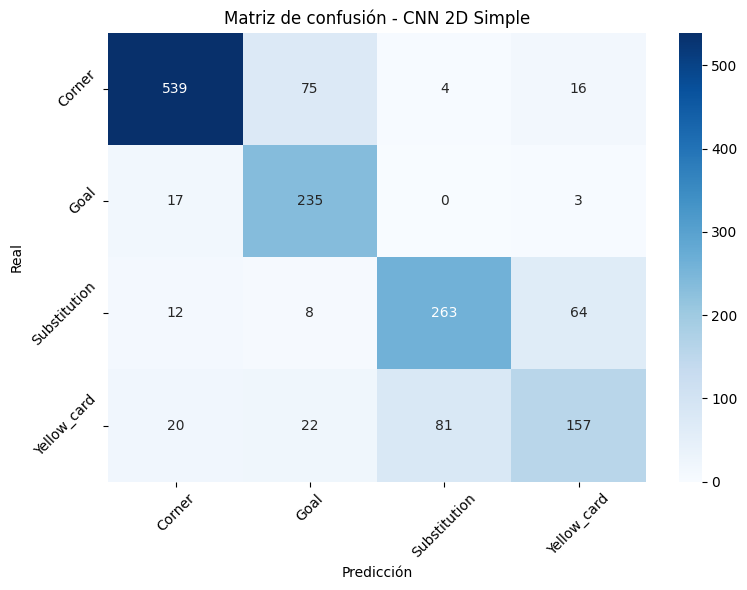


📊 Resultados para CNN 2D Mejorada
Accuracy: 0.8160
Tiempo promedio de inferencia por batch: 0.0019 s
Tiempo promedio por evento: 0.000030 s

              precision    recall  f1-score   support

      Corner       0.94      0.88      0.91       634
        Goal       0.86      0.89      0.87       255
Substitution       0.71      0.86      0.78       347
 Yellow_card       0.66      0.56      0.61       280

    accuracy                           0.82      1516
   macro avg       0.79      0.80      0.79      1516
weighted avg       0.82      0.82      0.82      1516



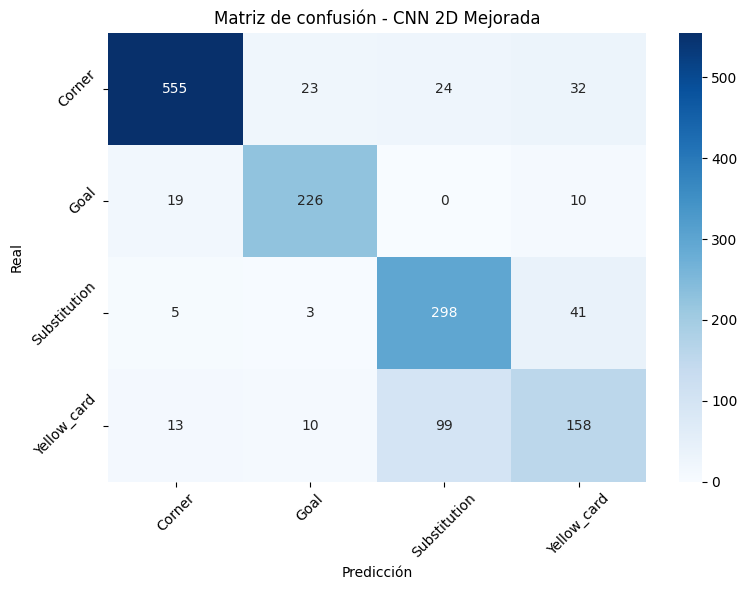

✅ Aciertos (Simple):
ID: 2015-02-25_-_22-45_Bayer_Lever_H1_T2508609 | Clase real: Goal | Predicción: Goal
ID: 2015-02-25_-_22-45_Bayer_Lever_H2_T1125121 | Clase real: Corner | Predicción: Corner
ID: 2015-04-19_-_21-45_Inter_0_-_0_H1_T1666680 | Clase real: Substitution | Predicción: Substitution
ID: 2015-05-16_-_19-00_Inter_1_-_2_H2_T2190400 | Clase real: Goal | Predicción: Goal
ID: 2015-02-21_-_18-00_Chelsea_1_-_H2_T2121494 | Clase real: Goal | Predicción: Goal

❌ Errores (Simple):
ID: 2015-05-09_-_16-30_Dortmund_2__H1_T1928434 | Clase real: Substitution | Predicción: Yellow_card
ID: 2015-05-09_-_16-30_Dortmund_2__H1_T1518992 | Clase real: Yellow_card | Predicción: Substitution
ID: 2015-02-22_-_23-00_Elche_0_-_2_H2_T2326280 | Clase real: Substitution | Predicción: Yellow_card
ID: 2015-04-11_-_21-00_Sevilla_2_-_H2_T1736461 | Clase real: Corner | Predicción: Goal
ID: 2015-02-24_-_22-45_Manchester__H1_T1781000 | Clase real: Substitution | Predicción: Yellow_card

✅ Aciertos (Mejorado):
ID

In [ ]:
# Cargar ambos modelos desde Google Drive
# Modelo base
modelo_base = CNN2DEventClassifier(num_classes=len(le.classes_)).to(device)
modelo_base.load_state_dict(torch.load("/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2/modelo_cnn2d.pth"))

# Modelo mejorado
modelo_mejorado = CNN2DMejorada(num_classes=len(le.classes_)).to(device)
modelo_mejorado.load_state_dict(torch.load("/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2/modelo_cnn2d_modified.pth"))

# Evaluar y guardar resultados
resultados_base, aciertos_base, errores_base = evaluar_modelo(modelo_base, test_loader, "CNN 2D Simple")
resultados_mejorado, aciertos_mejorado, errores_mejorado = evaluar_modelo(modelo_mejorado, test_loader, "CNN 2D Mejorada")

# Imprimir ejemplos representativos
print("✅ Aciertos (Simple):")
for eid, real, pred in aciertos_base:
    print(f"ID: {eid} | Clase real: {real} | Predicción: {pred}")

print("\n❌ Errores (Simple):")
for eid, real, pred in errores_base:
    print(f"ID: {eid} | Clase real: {real} | Predicción: {pred}")

print("\n✅ Aciertos (Mejorado):")
for eid, real, pred in aciertos_mejorado:
    print(f"ID: {eid} | Clase real: {real} | Predicción: {pred}")

print("\n❌ Errores (Mejorado):")
for eid, real, pred in errores_mejorado:
    print(f"ID: {eid} | Clase real: {real} | Predicción: {pred}")


🔍 Visualizando ejemplos representativos (5 aleatorios por tipo):
5
5
5
5

▶ Modelo Simple — Aciertos:
⚠️ No se encontraron todos los frames esperados para 2015-05-16_-_19-00_Inter_1_-_2_H2_T2190400 en Goal
Encontrados:


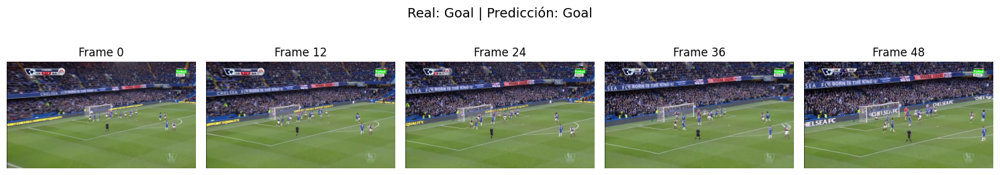

⚠️ No se encontraron todos los frames esperados para 2015-02-25_-_22-45_Bayer_Lever_H2_T1125121 en Corner
Encontrados:
⚠️ No se encontraron todos los frames esperados para 2015-04-19_-_21-45_Inter_0_-_0_H1_T1666680 en Substitution
Encontrados:
⚠️ No se encontraron todos los frames esperados para 2015-02-25_-_22-45_Bayer_Lever_H1_T2508609 en Goal
Encontrados:

▶ Modelo Simple — Errores:


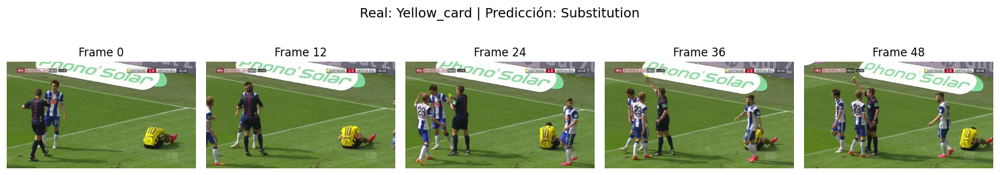

⚠️ No se encontraron todos los frames esperados para 2015-02-24_-_22-45_Manchester__H1_T1781000 en Substitution
Encontrados:


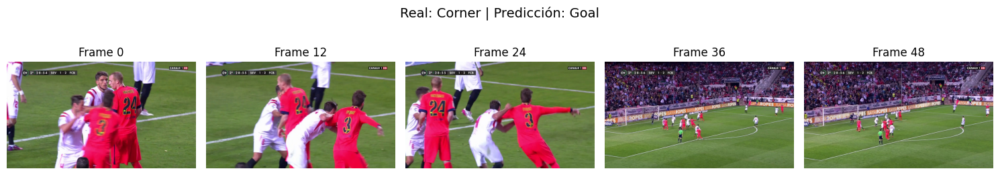

⚠️ No se encontraron todos los frames esperados para 2015-05-09_-_16-30_Dortmund_2__H1_T1928434 en Substitution
Encontrados:


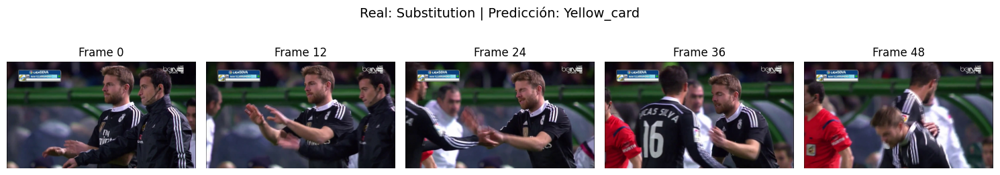


▶ Modelo Mejorado — Aciertos:


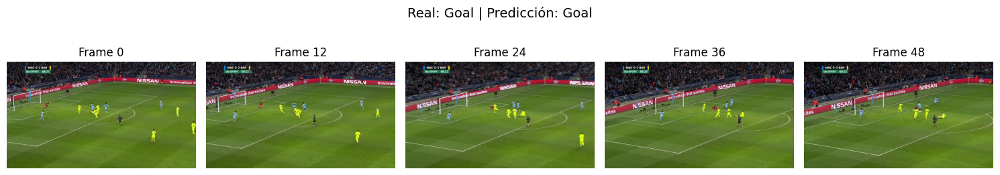

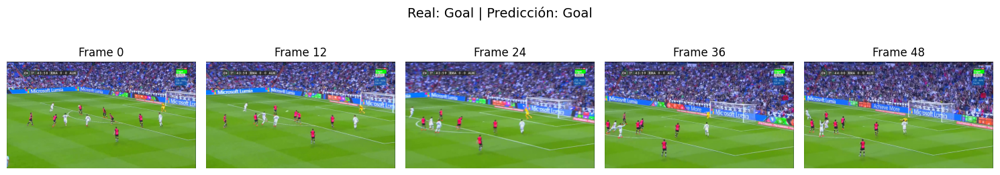

⚠️ No se encontraron todos los frames esperados para 2015-02-25_-_22-45_Arsenal_1_-_H1_T2259000 en Corner
Encontrados:
⚠️ No se encontraron todos los frames esperados para 2015-03-11_-_22-45_Bayern_Muni_H1_T634974 en Substitution
Encontrados:


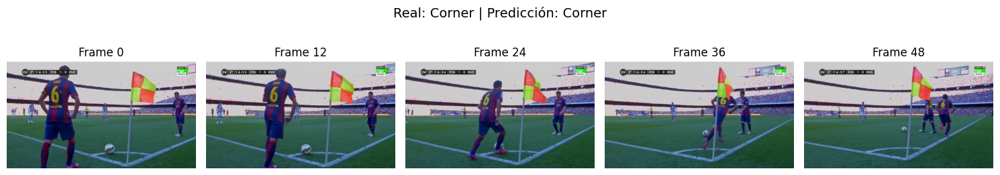


▶ Modelo Mejorado — Errores:


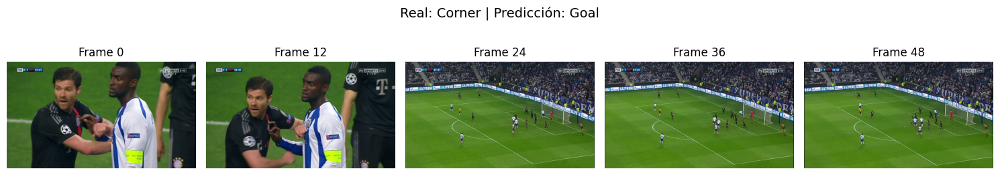

⚠️ No se encontraron todos los frames esperados para 2015-02-15_-_14-30_AC_Milan_1__H2_T1958410 en Substitution
Encontrados:


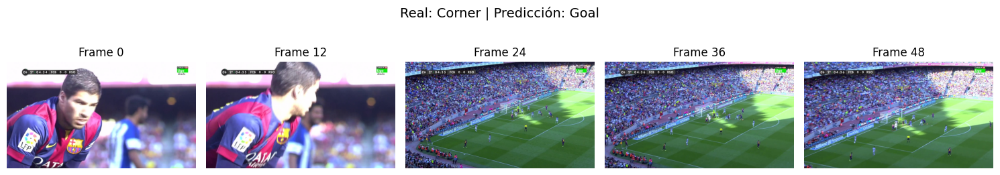

⚠️ No se encontraron todos los frames esperados para 2015-04-15_-_21-45_Paris_SG_1__H1_T1886561 en Corner
Encontrados:


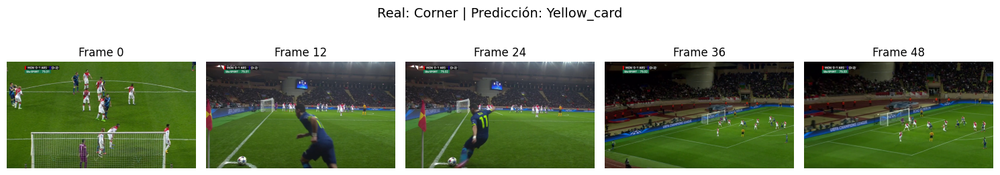

In [ ]:
# ————————————— Visualizaciones —————————————
import random

# Visualización de 5 aciertos y errores aleatorios por modelo
print("\n🔍 Visualizando ejemplos representativos (5 aleatorios por tipo):")
print(len(aciertos_base))
print(len(errores_base))
print(len(aciertos_mejorado))
print(len(errores_mejorado))

# CNN 2D Simple
print("\n▶ Modelo Simple — Aciertos:")
for eid, real, pred in random.sample(aciertos_base, min(5, len(aciertos_base))):
    mostrar_evento(eid, pred, real)

print("\n▶ Modelo Simple — Errores:")
for eid, real, pred in random.sample(errores_base, min(5, len(errores_base))):
    mostrar_evento(eid, pred, real)

# CNN 2D Mejorada
print("\n▶ Modelo Mejorado — Aciertos:")
for eid, real, pred in random.sample(aciertos_mejorado, min(5, len(aciertos_mejorado))):
    mostrar_evento(eid, pred, real)

print("\n▶ Modelo Mejorado — Errores:")
for eid, real, pred in random.sample(errores_mejorado, min(5, len(errores_mejorado))):
    mostrar_evento(eid, pred, real)

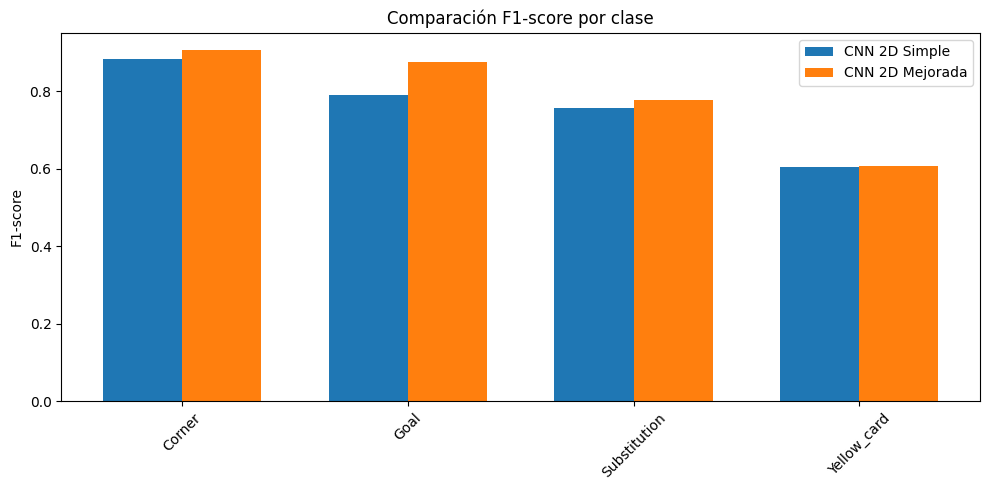

In [ ]:
# Visualizar comparación por clases
# Comparar F1-score por clase
clases = le.classes_
f1_base = [resultados_base[clase]["f1-score"] for clase in clases]
f1_mejorado = [resultados_mejorado[clase]["f1-score"] for clase in clases]

x = np.arange(len(clases))
width = 0.35

plt.figure(figsize=(10, 5))
plt.bar(x - width/2, f1_base, width, label="CNN 2D Simple")
plt.bar(x + width/2, f1_mejorado, width, label="CNN 2D Mejorada")
plt.xticks(x, clases, rotation=45)
plt.ylabel("F1-score")
plt.title("Comparación F1-score por clase")
plt.legend()
plt.tight_layout()
plt.show()

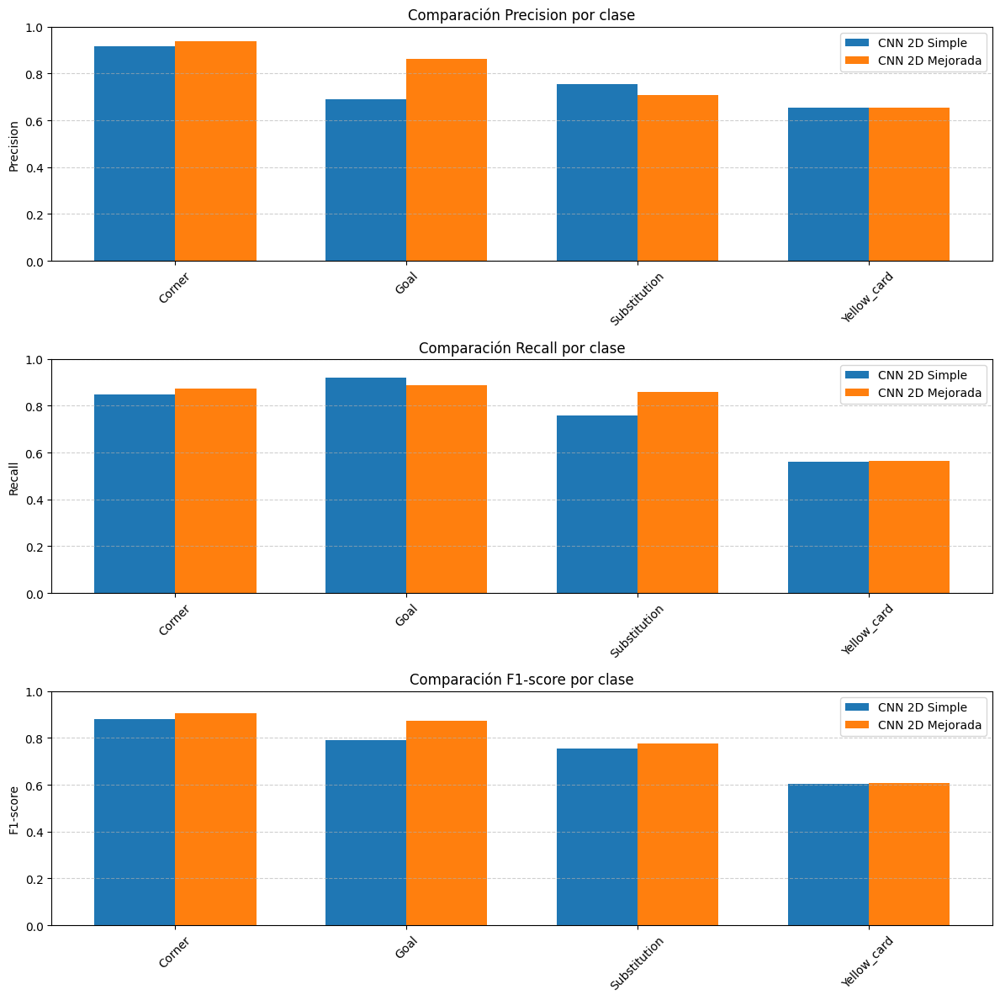

In [ ]:
# Visualizar múltiples métricas por clase
import matplotlib.pyplot as plt
import numpy as np

# Métricas a comparar
metricas = ["precision", "recall", "f1-score"]
clases = le.classes_

# Crear figura
num_clases = len(clases)
x = np.arange(num_clases)
width = 0.35  # ancho de las barras

fig, axs = plt.subplots(len(metricas), 1, figsize=(12, 4 * len(metricas)))

for i, metrica in enumerate(metricas):
    valores_base = [resultados_base[clase][metrica] for clase in clases]
    valores_mejorado = [resultados_mejorado[clase][metrica] for clase in clases]

    axs[i].bar(x - width/2, valores_base, width, label="CNN 2D Simple")
    axs[i].bar(x + width/2, valores_mejorado, width, label="CNN 2D Mejorada")

    axs[i].set_title(f"Comparación {metrica.capitalize()} por clase")
    axs[i].set_xticks(x)
    axs[i].set_xticklabels(clases, rotation=45)
    axs[i].set_ylabel(metrica.capitalize())
    axs[i].set_ylim(0, 1)
    axs[i].legend()
    axs[i].grid(True, axis='y', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

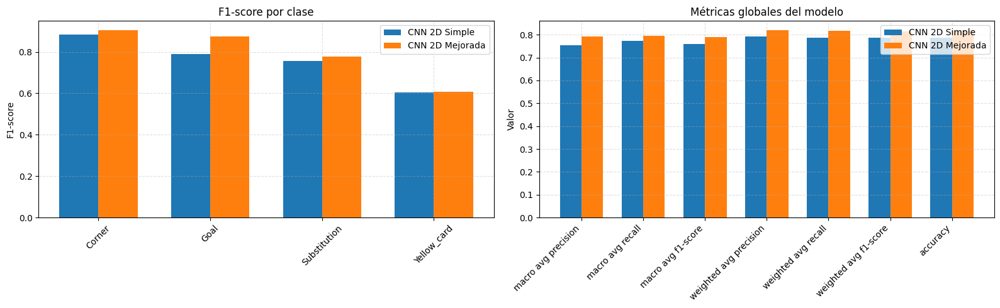

In [ ]:
# Comparación de métricas entre modelos
import matplotlib.pyplot as plt
import numpy as np

# Extraer nombres de clases
clases = le.classes_

# Comparación de F1-score por clase
f1_base = [resultados_base[clase]["f1-score"] for clase in clases]
f1_mejorado = [resultados_mejorado[clase]["f1-score"] for clase in clases]

# Extraer métricas globales
metricas_globales = ["precision", "recall", "f1-score"]
tipos_avg = ["macro avg", "weighted avg"]

global_base = [resultados_base[avg][m] for avg in tipos_avg for m in metricas_globales]
global_mejorado = [resultados_mejorado[avg][m] for avg in tipos_avg for m in metricas_globales]

# Añadir accuracy total
global_base.append(resultados_base["accuracy"])
global_mejorado.append(resultados_mejorado["accuracy"])

n_metricas = len(global_base)
labels_globales = [f"{avg} {m}" for avg in tipos_avg for m in metricas_globales] + ["accuracy"]

# === FIGURA COMPUESTA ===
fig, axs = plt.subplots(1, 2, figsize=(16, 5))

# Subplot 1: F1-score por clase
x = np.arange(len(clases))
width = 0.35
axs[0].bar(x - width/2, f1_base, width, label="CNN 2D Simple")
axs[0].bar(x + width/2, f1_mejorado, width, label="CNN 2D Mejorada")
axs[0].set_xticks(x)
axs[0].set_xticklabels(clases, rotation=45)
axs[0].set_title("F1-score por clase")
axs[0].set_ylabel("F1-score")
axs[0].legend()
axs[0].grid(True, linestyle='--', alpha=0.4)

# Subplot 2: Métricas globales
xg = np.arange(n_metricas)
axs[1].bar(xg - width/2, global_base, width, label="CNN 2D Simple")
axs[1].bar(xg + width/2, global_mejorado, width, label="CNN 2D Mejorada")
axs[1].set_xticks(xg)
axs[1].set_xticklabels(labels_globales, rotation=45, ha="right")
axs[1].set_title("Métricas globales del modelo")
axs[1].set_ylabel("Valor")
axs[1].legend()
axs[1].grid(True, linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

### Aplicar CNN 3D

In [ ]:
# Reorganizar los tensores para CNN 3D
# Los tensores originales están en formato (N, 5, 25, 5)
# Para CNN 3D necesitamos (N, 1, 5, 25, 5) → (batch_size, channels, depth, height, width)

X_train_3d = X_train[:, np.newaxis, :, :, :]  # Añadir canal
X_val_3d = X_val[:, np.newaxis, :, :, :]
X_test_3d = X_test[:, np.newaxis, :, :, :]

print(f"Shape CNN 3D - Train: {X_train_3d.shape}, Val: {X_val_3d.shape}, Test: {X_test_3d.shape}")

Shape CNN 3D - Train: (7069, 1, 5, 25, 5), Val: (1516, 1, 5, 25, 5), Test: (1516, 1, 5, 25, 5)


In [ ]:
# Dataset adaptado para CNN 3D
class SoccerEventsDataset3D(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)  # (N, 1, 5, 25, 5)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [ ]:
# Crear los DataLoaders
train_dataset = SoccerEventsDataset3D(X_train_3d, y_train)
val_dataset = SoccerEventsDataset3D(X_val_3d, y_val)
test_dataset = SoccerEventsDataset3D(X_test_3d, y_test)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64)
test_loader = DataLoader(test_dataset, batch_size=64)

In [ ]:
# Arquitectura mejorada
import torch.nn as nn
import torch.nn.functional as F

class CNN3DMejorada(nn.Module):
    def __init__(self, num_classes):
        super(CNN3DMejorada, self).__init__()

        self.conv1 = nn.Conv3d(1, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm3d(32)

        self.conv2 = nn.Conv3d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm3d(64)

        self.conv3 = nn.Conv3d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm3d(128)

        self.pool = nn.AdaptiveAvgPool3d((1, 1, 1))  # Salida: (B, 128, 1, 1, 1)

        self.fc1 = nn.Linear(128, 128)
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(128, num_classes)

        self.activation = nn.GELU()

    def forward(self, x):
        x = self.activation(self.bn1(self.conv1(x)))
        x = self.activation(self.bn2(self.conv2(x)))
        x = self.activation(self.bn3(self.conv3(x)))
        x = self.pool(x)
        x = x.view(x.size(0), -1)
        x = self.activation(self.fc1(x))
        x = self.dropout(x)
        return self.fc2(x)

In [ ]:
# Inicialización del modelo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNN3DMejorada(num_classes=len(le.classes_)).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-5)

In [ ]:
# Entrenamiento con early stopping
import copy

EPOCHS = 100
patience = 10  # early stopping
best_val_loss = float('inf')
patience_counter = 0

hist_train_loss = []
hist_val_loss = []
hist_train_acc = []
hist_val_acc = []

mejor_modelo = copy.deepcopy(model.state_dict())

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    hist_train_loss.append(train_loss)
    hist_val_loss.append(val_loss)
    hist_train_acc.append(train_acc)
    hist_val_acc.append(val_acc)

    print(f"🔁 Época {epoch+1}/{EPOCHS}")
    print(f"  🔹 Train: Loss={train_loss:.4f}, Acc={train_acc:.4f}")
    print(f"  🔹 Val:   Loss={val_loss:.4f}, Acc={val_acc:.4f}")

    # Verificar mejora
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        mejor_modelo = copy.deepcopy(model.state_dict())
        torch.save(mejor_modelo, "/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2/modelo_cnn3d_mejorado.pth")
        print("✅ Modelo mejorado guardado.")
    else:
        patience_counter += 1
        print(f"⏳ No mejora. Contador paciencia: {patience_counter}/{patience}")

    # Early stopping
    if patience_counter >= patience:
        print("🛑 Early stopping activado.")
        break

🔁 Época 1/100
  🔹 Train: Loss=0.8190, Acc=0.6489
  🔹 Val:   Loss=0.8652, Acc=0.5937
✅ Modelo mejorado guardado.
🔁 Época 2/100
  🔹 Train: Loss=0.6039, Acc=0.7611
  🔹 Val:   Loss=0.7884, Acc=0.6728
✅ Modelo mejorado guardado.
🔁 Época 3/100
  🔹 Train: Loss=0.5290, Acc=0.7998
  🔹 Val:   Loss=0.5087, Acc=0.8087
✅ Modelo mejorado guardado.
🔁 Época 4/100
  🔹 Train: Loss=0.4863, Acc=0.8128
  🔹 Val:   Loss=0.5137, Acc=0.8054
⏳ No mejora. Contador paciencia: 1/10
🔁 Época 5/100
  🔹 Train: Loss=0.4683, Acc=0.8226
  🔹 Val:   Loss=0.4934, Acc=0.8186
✅ Modelo mejorado guardado.
🔁 Época 6/100
  🔹 Train: Loss=0.4314, Acc=0.8411
  🔹 Val:   Loss=0.7869, Acc=0.7355
⏳ No mejora. Contador paciencia: 1/10
🔁 Época 7/100
  🔹 Train: Loss=0.4146, Acc=0.8476
  🔹 Val:   Loss=0.4987, Acc=0.8113
⏳ No mejora. Contador paciencia: 2/10
🔁 Época 8/100
  🔹 Train: Loss=0.4032, Acc=0.8522
  🔹 Val:   Loss=0.5869, Acc=0.7863
⏳ No mejora. Contador paciencia: 3/10
🔁 Época 9/100
  🔹 Train: Loss=0.3837, Acc=0.8549
  🔹 Val:   Loss

In [ ]:
# Guardar el modelo CNN 3D en Google Drive
torch.save(model.state_dict(), "/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2/modelo_cnn3d_mejorado.pth")

###Evaluación de la CNN 3D y comparación con las CNN 2D

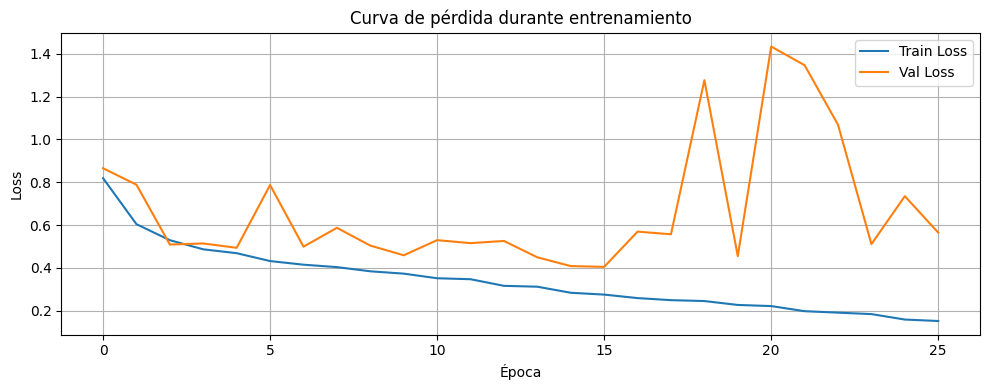

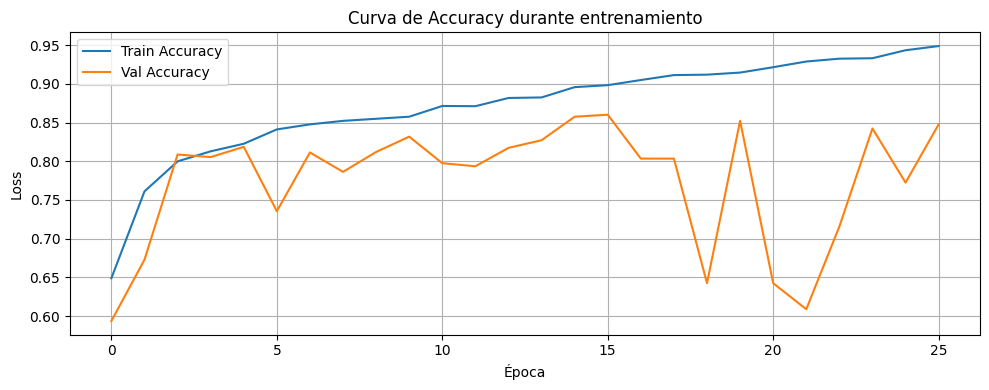

In [ ]:
# Curvas de entrenamiento
plt.figure(figsize=(10, 4))
plt.plot(hist_train_loss, label="Train Loss")
plt.plot(hist_val_loss, label="Val Loss")
plt.xlabel("Época")
plt.ylabel("Loss")
plt.title("Curva de pérdida durante entrenamiento")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 4))
plt.plot(hist_train_acc, label="Train Accuracy")
plt.plot(hist_val_acc, label="Val Accuracy")
plt.xlabel("Época")
plt.ylabel("Loss")
plt.title("Curva de Accuracy durante entrenamiento")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


📊 Resultados para CNN 3D Mejorada
Accuracy: 0.8463
Tiempo promedio de inferencia por batch: 0.0007 s
Tiempo promedio por evento: 0.000011 s

              precision    recall  f1-score   support

      Corner       0.90      0.94      0.92       634
        Goal       0.87      0.88      0.87       255
Substitution       0.76      0.87      0.81       347
 Yellow_card       0.83      0.56      0.67       280

    accuracy                           0.85      1516
   macro avg       0.84      0.81      0.82      1516
weighted avg       0.85      0.85      0.84      1516



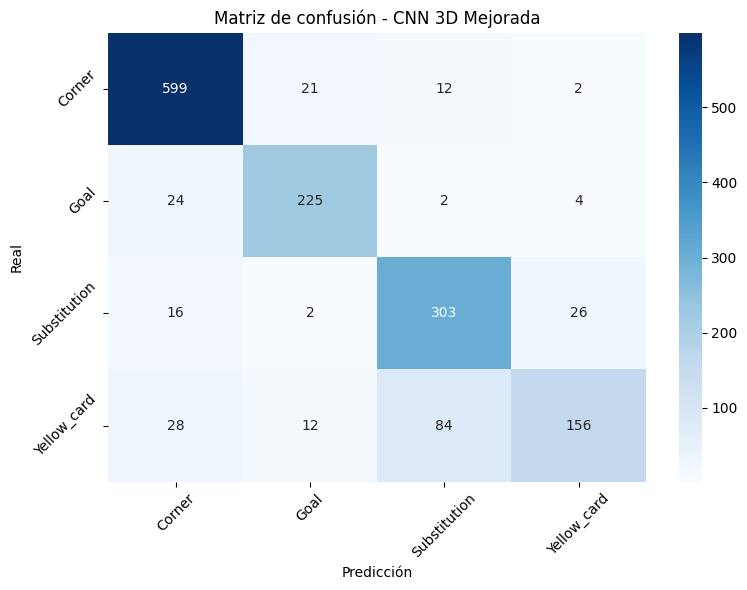

In [ ]:
# Cargar y evaluar el modelo
# Cargar el modelo mejorado CNN 3D
modelo_3d = CNN3DMejorada(num_classes=len(le.classes_)).to(device)
modelo_3d.load_state_dict(torch.load("/content/drive/MyDrive/SoccerNet_YOLOv5_Detections2/modelo_cnn3d_mejorado.pth"))

# Evaluar el modelo
resultados_3d, aciertos_3d, errores_3d = evaluar_modelo(modelo_3d, test_loader, "CNN 3D Mejorada")


✅ Aciertos (CNN 3D Mejorada):
⚠️ No se encontraron todos los frames esperados para 2015-02-21_-_18-00_Swansea_2_-_H1_T254201 en Substitution
Encontrados:
⚠️ No se encontraron todos los frames esperados para 2015-05-09_-_21-00_Real_Madrid_H2_T1399800 en Goal
Encontrados:


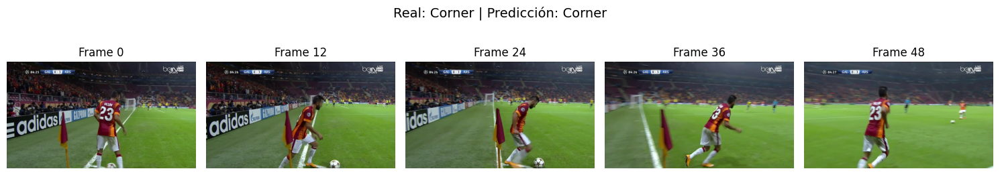

⚠️ No se encontraron todos los frames esperados para 2015-05-02_-_16-30_Hoffenheim__H1_T749237 en Yellow_card
Encontrados:


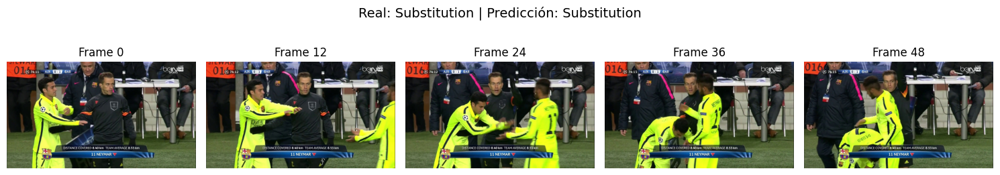


❌ Errores (CNN 3D Mejorada):


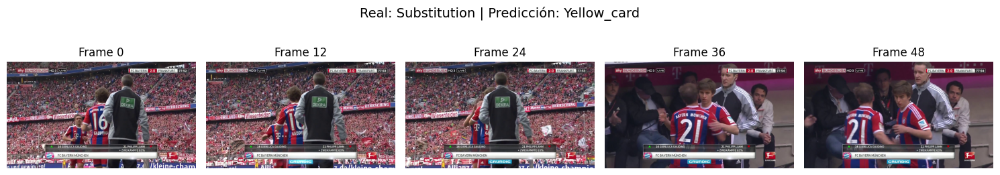

⚠️ No se encontraron todos los frames esperados para 2014-11-04_-_22-45_Dortmund_4__H1_T1443290 en Substitution
Encontrados:
⚠️ No se encontraron todos los frames esperados para 2015-04-11_-_17-00_Real_Madrid_H2_T2045800 en Substitution
Encontrados:


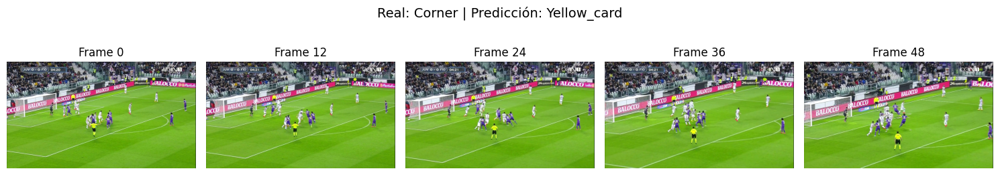

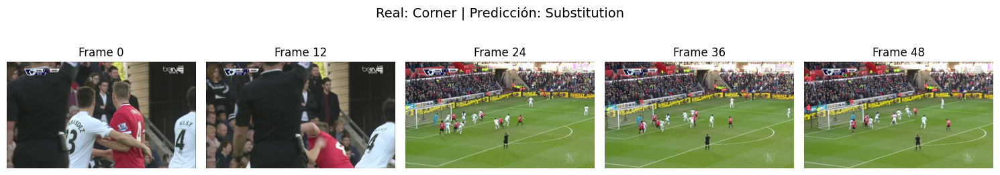

In [ ]:

# Visualizar 5 aciertos y errores aleatorios
print("\n✅ Aciertos (CNN 3D Mejorada):")
for eid, real, pred in random.sample(aciertos_3d, min(5, len(aciertos_3d))):
    mostrar_evento(eid, pred, real)

print("\n❌ Errores (CNN 3D Mejorada):")
for eid, real, pred in random.sample(errores_3d, min(5, len(errores_3d))):
    mostrar_evento(eid, pred, real)

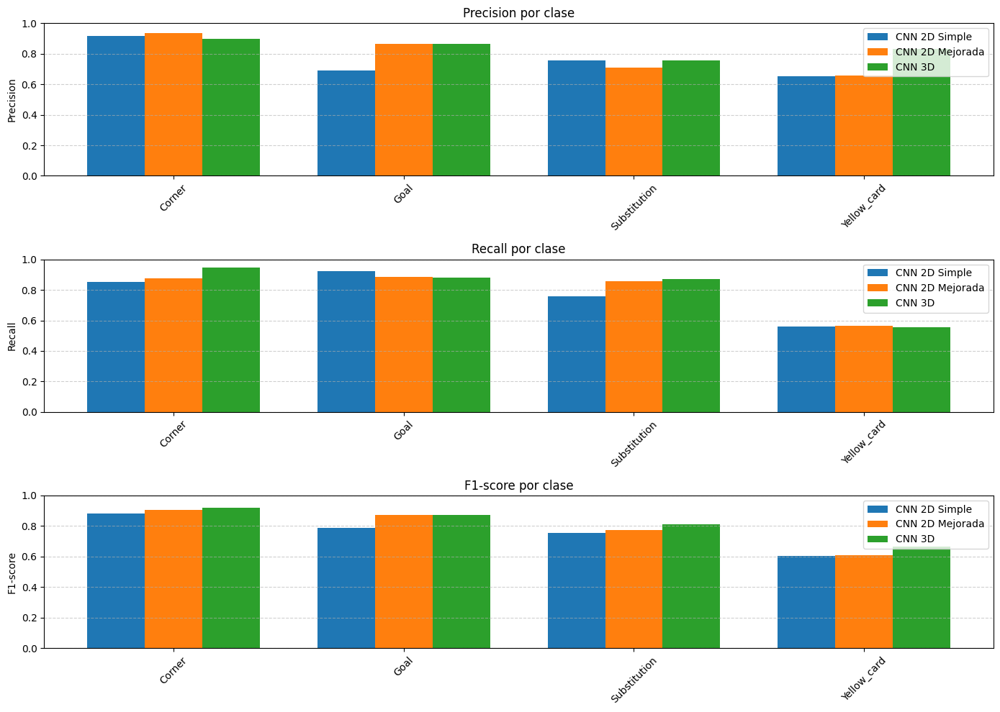

In [ ]:
# Métricas por clase: precision, recall, f1-score
import matplotlib.pyplot as plt
import numpy as np

metricas = ["precision", "recall", "f1-score"]
clases = le.classes_
x = np.arange(len(clases))
width = 0.25  # espacio más pequeño por barra

plt.figure(figsize=(14, 10))

for i, metrica in enumerate(metricas):
    valores_2d_simple = [resultados_base[clase][metrica] for clase in clases]
    valores_2d_mejorada = [resultados_mejorado[clase][metrica] for clase in clases]
    valores_3d = [resultados_3d[clase][metrica] for clase in clases]

    plt.subplot(3, 1, i+1)
    plt.bar(x - width, valores_2d_simple, width=width, label="CNN 2D Simple")
    plt.bar(x, valores_2d_mejorada, width=width, label="CNN 2D Mejorada")
    plt.bar(x + width, valores_3d, width=width, label="CNN 3D")

    plt.xticks(x, clases, rotation=45)
    plt.ylim(0, 1)
    plt.ylabel(metrica.capitalize())
    plt.title(f"{metrica.capitalize()} por clase")
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.legend()

plt.tight_layout()
plt.show()

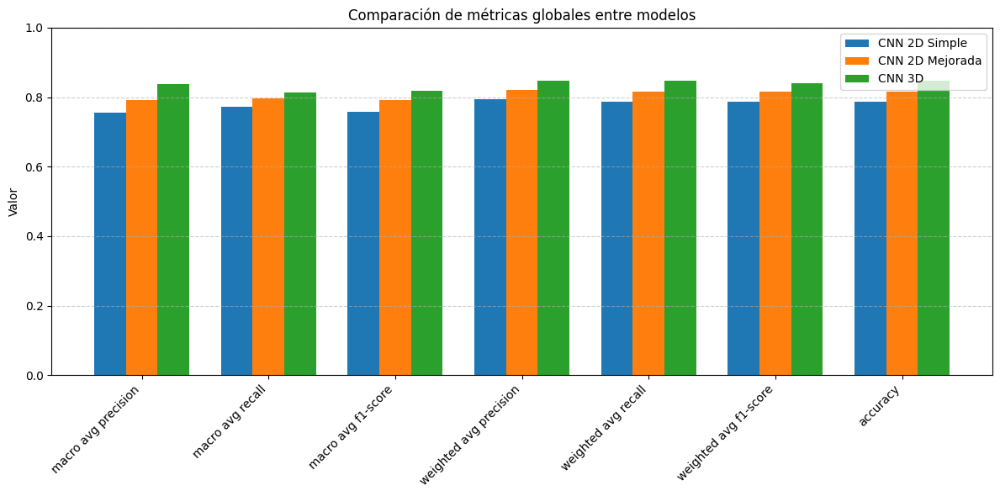

In [ ]:
# Métricas globales
tipos_avg = ["macro avg", "weighted avg"]
metricas_globales = ["precision", "recall", "f1-score"]

# Extraer valores
valores_base = [resultados_base[avg][m] for avg in tipos_avg for m in metricas_globales]
valores_mejorado = [resultados_mejorado[avg][m] for avg in tipos_avg for m in metricas_globales]
valores_3d = [resultados_3d[avg][m] for avg in tipos_avg for m in metricas_globales]

# Añadir accuracy
valores_base.append(resultados_base["accuracy"])
valores_mejorado.append(resultados_mejorado["accuracy"])
valores_3d.append(resultados_3d["accuracy"])

labels = [f"{avg} {m}" for avg in tipos_avg for m in metricas_globales] + ["accuracy"]
x = np.arange(len(labels))
width = 0.25

plt.figure(figsize=(12, 6))
plt.bar(x - width, valores_base, width=width, label="CNN 2D Simple")
plt.bar(x, valores_mejorado, width=width, label="CNN 2D Mejorada")
plt.bar(x + width, valores_3d, width=width, label="CNN 3D")

plt.xticks(x, labels, rotation=45, ha="right")
plt.ylim(0, 1)
plt.title("Comparación de métricas globales entre modelos")
plt.ylabel("Valor")
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()